In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import random
import string
import subprocess
import anndata as an
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy 
import warnings
from collections import Counter
from sklearn.mixture import GaussianMixture as GMM
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import fdrcorrection

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.19.5 scipy==1.7.0 pandas==1.3.4 scikit-learn==1.0 statsmodels==0.12.2 python-igraph==0.9.6 pynndescent==0.5.4


In [5]:
umi = sc.read_h5ad("/mnt/ccle_umi.h5ad")
umi.var.index = umi.var['Unnamed: 0']
umi_process = sc.read_h5ad('/mnt/ccle_umi_process.h5ad')

/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


### Expression programs

In [923]:
def run_cluster(patient_name):

    data = umi[umi.obs.CCLE_ID == patient_name]

    ########preprocessing data (variable genes)
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.highly_variable_genes(data, min_mean=0.01, max_mean=3, min_disp=0.2)

    data.raw = data
    data = data[:,data.var['highly_variable']]

    X = pd.DataFrame(data.X.todense().T,
                     index=list(data.var.index),
                     columns=list(data.obs.index))

    #########run Bayesian NMF
    res = sa.ardnmf(X ,
                    K0=20,
                    tolerance=0.02, 
                    prior_on_W='L2',
                    prior_on_H='L2', 
                    max_iter = 10000)

    adata, W, H = annotate_adata_sigs(data, res)
    objective = res['objective']

    ##########Leiden clustering
    sc.tl.pca(data)
    sc.pp.neighbors(data , 
                    n_pcs= 3,
                    n_neighbors = 10)
    sc.tl.leiden(data, resolution = 0.05)
    
    if data.obs.leiden.unique().shape[0]==1:
        sc.tl.leiden(data, resolution = 0.08)
        if data.obs.leiden.unique().shape[0]==1:
            sc.tl.leiden(data, resolution = 0.1)
    if data.obs.leiden.unique().shape[0]>2:
        sc.tl.leiden(data, resolution = 0.02)

    
    sc.tl.rank_genes_groups(data, groupby='leiden', method='wilcoxon')
    
    ##########Add CNA based clustering to obs data
    for p in gmm_result[(gmm_result['patient_name'] == patient_name) & 
                                                  (gmm_result['selected_arm'] == True)].arm.unique():
        data.obs[f'cna_cluster_{p}'] = gmm_result[(gmm_result['patient_name'] == patient_name) & 
                                                  (gmm_result['selected_arm'] == True) &
                                                  (gmm_result['arm'] == p) ]['GMM classification'].values 

    ##########Test significant overlap bewteen leiden and GMM cluster
    fisher_pval= []
    for p in gmm_result[(gmm_result['patient_name'] == patient_name) & 
                                                  (gmm_result['selected_arm'] == True)].arm.unique():
        fisher_pval.append( { 'arm':p, 'pval': fisher_exact(pd.crosstab(data.obs['leiden'], data.obs[f'cna_cluster_{p}']))[1] })
    fisher_pval = pd.DataFrame(fisher_pval)
    fisher_pval['fdr'] = fdrcorrection(fisher_pval['pval'])[1]

    ###########relabel classification
    label = gmm_result[(gmm_result['patient_name'] == patient_name) & (gmm_result['selected_arm'] == True)].groupby(by = ['arm','GMM classification']).mean()[['class_0_mean','class_1_mean']].reset_index()
    for l in label.arm.unique():

        data.obs[f'cna_cluster_{l}_cat'] = f'gain_{l}'
        if list(label[label['arm'] == l]['class_0_mean'])[0]< 0 :
            data.obs.loc[data.obs[f'cna_cluster_{l}'] == 0,f'cna_cluster_{l}_cat'] = f'loss_{l}'
        else: 
            data.obs.loc[data.obs[f'cna_cluster_{l}'] == 1,f'cna_cluster_{l}_cat'] = f'loss_{l}'

        data.obs[f'cna_cluster_{l}_cat'] = pd.Categorical(data.obs[f'cna_cluster_{l}_cat'],  
                                                                        ordered=True, 
                                                                        categories=list([f'loss_{l}', f'gain_{l}']) )


    ########add copy number to obs data
    subtype_cna = pd.read_csv(f"/mnt/{patient_name}_cna.csv")
    subtype_cna.index = subtype_cna['arm']
    subtype_cna=subtype_cna.drop(columns = ['arm']).T
    subtype_cna['patient'] = patient_name

    for p in subtype_cna.columns[:-1]:
        data.obs[p] =subtype_cna[p]

    #########process Bayesian NMF
    Sidx = W.columns[W.columns.str.match('S\d+')]
    sort_idx = H[Sidx].sum().sort_values(ascending=False).index
    H = H[sort_idx]
    H.columns=Sidx
    W = W[sort_idx]
    W.columns=Sidx
    W['max'] = W[Sidx].max(axis=1)
    W['max_id'] = np.argmax(W[Sidx].values,axis=1)+1

    S = identify_markers(W, H, max_genes = 5)

    H_rate = H.div(data.obs['total_counts'], axis = 0)*10**3
    H_log_rate = np.log10(H_rate[Sidx]+1)
    H_log_rate = H_log_rate.add_prefix("log")
    H_rate_concat = pd.concat([H_rate, data.obs], axis = 1)
    full_R = get_ranking_matrix(W,H)

    for i in range(S.shape[0]):
        print(i)
        data.obs[f'S{i+1}'] = H_rate[f'S{i+1}']
        
    return data, fisher_pval, full_R

In [732]:
def plot_distr(data_c1, full_R_c1, 
               name1, name2, p1, p2):

    fig, ax = plt.subplots(1,2,figsize=(16,5))


    sns.violinplot(ax = ax[0], data = data_c1.obs ,x = name1, y ="S1", color = "white", alpha = 0.4)
    sns.swarmplot(ax = ax[0], data = data_c1.obs ,x = name1, y ="S1", alpha= 0.7)
    ax[0].set_title(",".join(list(full_R_c1.sort_values(by = "S1",ascending = False).index[:8])))
    ax[0].set_ylabel("Activation rate per cell for S1")

    ax[0].scatter(
                    x=0, 
                    y=data_c1.obs.groupby(by = name1).mean()['S1'][0], 
                    color='r', s = 200, label = "Mean activation")
    ax[0].scatter(
                    x=1, 
                    y=data_c1.obs.groupby(by = name1).mean()['S1'][1], 
                    color='r', s = 200)

    sns.violinplot(ax = ax[1],data = data_c1.obs ,x = name2, y ="S2", color = "white",alpha = 0.4)
    sns.swarmplot(ax = ax[1],data = data_c1.obs ,x = name2, y ="S2", alpha = 0.7)
    ax[1].set_title(",".join(list(full_R_c1.sort_values(by = "S2",ascending = False).index[:8])))
    ax[1].set_ylabel("Activation rate per cell for S2")
    ax[1].scatter(
                    x=0, 
                    y=data_c1.obs.groupby(by = name2).mean()['S2'][0], 
                    color='r', s = 200, label = "Mean activation")
    ax[1].scatter(
                    x=1, 
                    y=data_c1.obs.groupby(by = name2).mean()['S2'][1], 
                    color='r', s = 200)

    ax[0].set_xlabel(f"Cluster assignment based on \n {p1} copy number alteration")
    ax[1].set_xlabel(f"Cluster assignment based on \n {p2} copy number alteration")

    ax[1].legend(loc='upper left', bbox_to_anchor=(1, 0.5))

    plt.show()

In [803]:
def plot_distr_2(data_c1, full_R_c1, 
               name1, name2, p1, p2):

    fig, ax = plt.subplots(1,2,figsize=(16,5))


    sns.violinplot(ax = ax[0], data = data_c1.obs ,x = name1, y ="S3", color = "white", alpha = 0.4)
    sns.swarmplot(ax = ax[0], data = data_c1.obs ,x = name1, y ="S3", alpha= 0.7)
    ax[0].set_title(",".join(list(full_R_c1.sort_values(by = "S3",ascending = False).index[:8])))
    ax[0].set_ylabel("Activation rate per cell for S3")

    ax[0].scatter(
                    x=0, 
                    y=data_c1.obs.groupby(by = name1).mean()['S3'][0], 
                    color='r', s = 200, label = "Mean activation")
    ax[0].scatter(
                    x=1, 
                    y=data_c1.obs.groupby(by = name1).mean()['S3'][1], 
                    color='r', s = 200)

    sns.violinplot(ax = ax[1],data = data_c1.obs ,x = name2, y ="S2", color = "white",alpha = 0.4)
    sns.swarmplot(ax = ax[1],data = data_c1.obs ,x = name2, y ="S2", alpha = 0.7)
    ax[1].set_title(",".join(list(full_R_c1.sort_values(by = "S2",ascending = False).index[:8])))
    ax[1].set_ylabel("Activation rate per cell for S2")
    ax[1].scatter(
                    x=0, 
                    y=data_c1.obs.groupby(by = name2).mean()['S2'][0], 
                    color='r', s = 200, label = "Mean activation")
    ax[1].scatter(
                    x=1, 
                    y=data_c1.obs.groupby(by = name2).mean()['S2'][1], 
                    color='r', s = 200)

    ax[0].set_xlabel(f"Cluster assignment based on \n {p1} copy number alteration")
    ax[1].set_xlabel(f"Cluster assignment based on \n {p2} copy number alteration")

    ax[1].legend(loc='upper left', bbox_to_anchor=(1, 0.5))

    plt.show()

### NCIH1568_LUNG

In [786]:
data_lung, pval_fisher_lung, full_R_lung = run_cluster(patient_name = 'NCIH1568_LUNG')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.1267990728857738
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=495677.94	b_div=558022.44	lam=2.64	del=0.99998087	sumW=31212.53	sumH=541.92
nit=   60 K=    4 | obj=-225313.17	b_div=263559.81	lam=0.16	del=0.01707440	sumW=1514.46	sumH=533.09


Clusters: 100%|██████████| 4/4 [00:00<00:00, 80.93it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
3


In [787]:
data_lung.obs.to_csv("/mnt/NCIH1568_LUNG_analysis.csv")
pval_fisher_lung.to_csv("/mnt/pval_fisher_NCIH1568_LUNG.csv")
full_R_lung.to_csv("/mnt/full_R_NCIH1568_LUNG.csv")

In [788]:
pval_fisher_lung[pval_fisher_lung['fdr']<0.1].sort_values(by = "fdr")

,arm,pval,fdr
4,7q,4.974894e-43,2.487447e-42
1,18q,1.272316e-29,3.180790e-29
0,18p,1.231572e-28,2.052619e-28
3,5p,1.284836e-27,1.606045e-27
2,2q,2.883220e-21,2.883220e-21


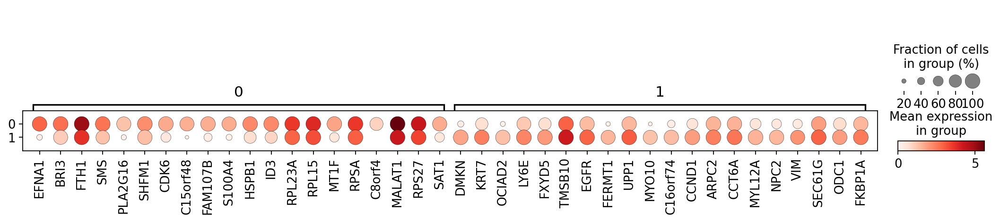

In [834]:
sc.pl.rank_genes_groups_dotplot(data_lung, n_genes=20)

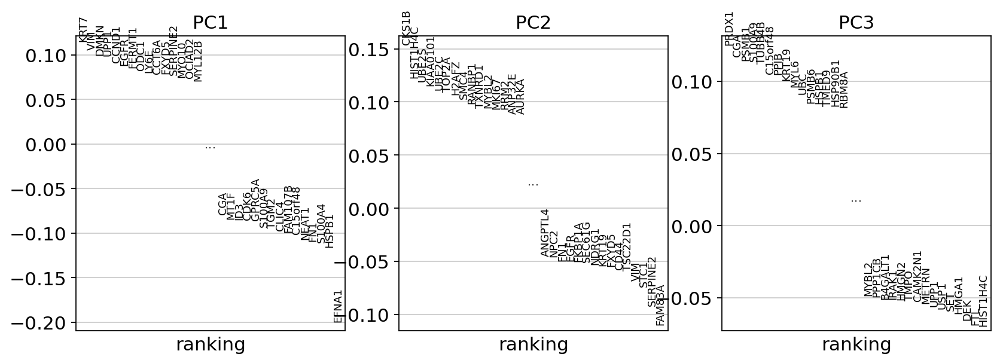

In [792]:
sc.pl.pca_loadings(data_lung)

In [846]:
for p in pd.DataFrame(data_lung.uns['rank_genes_groups']['names'])['1'][:30]:
    print(p)

DMKN
KRT7
OCIAD2
LY6E
FXYD5
TMSB10
EGFR
FERMT1
UPP1
MYO10
C16orf74
CCND1
ARPC2
CCT6A
MYL12A
NPC2
VIM
SEC61G
ODC1
FKBP1A
MYL12B
CHCHD2
TARS
RPS2
TXN
TACSTD2
HMGN1
HMGA2
SOX4
PHLDA1


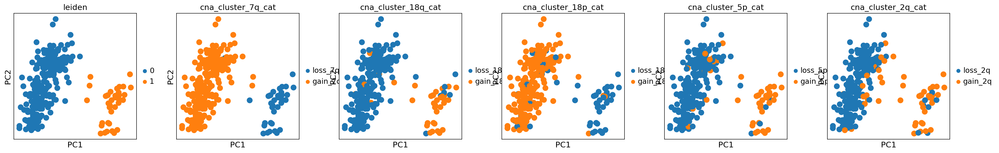

In [790]:
sc.pl.pca(data_lung, color = ['leiden','cna_cluster_7q_cat','cna_cluster_18q_cat','cna_cluster_18p_cat','cna_cluster_5p_cat', 'cna_cluster_2q_cat'], ncols= 6)

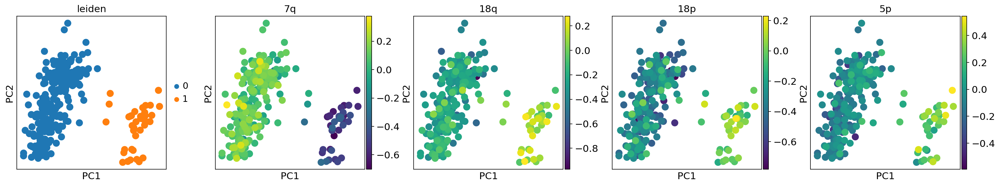

In [810]:
sc.pl.pca(data_lung, color = ['leiden','7q','18q','18p','5p'], ncols= 6)

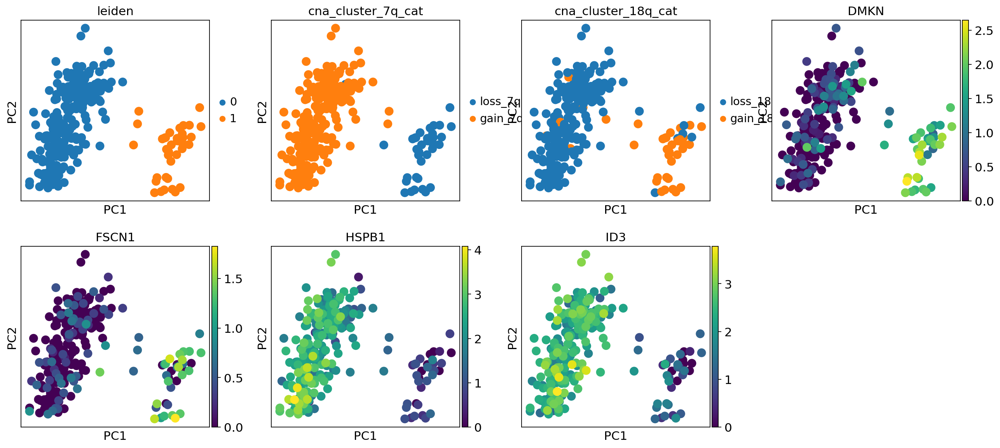

In [833]:
sc.pl.pca(data_lung, color = ['leiden','cna_cluster_7q_cat','cna_cluster_18q_cat','DMKN','FSCN1','HSPB1','ID3'], ncols= 4)

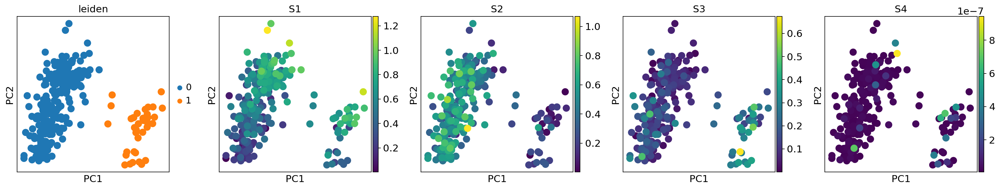

In [799]:
sc.pl.pca(data_lung, color = ['leiden','S1','S2','S3','S4'], ncols= 6)

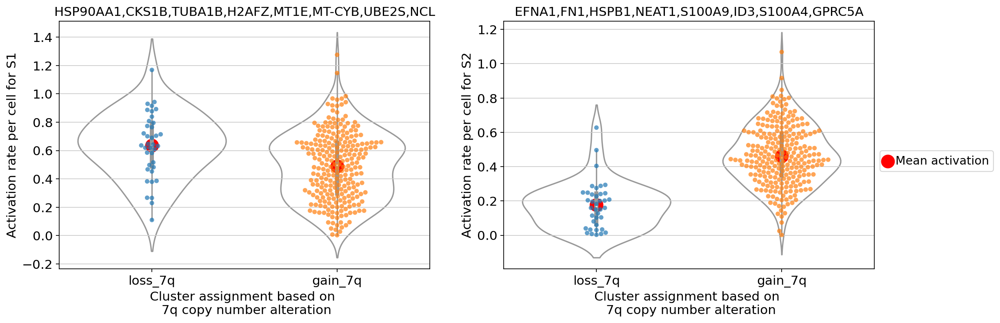

In [793]:
plot_distr(data_c1 =data_lung, full_R_c1 =full_R_lung, 
           name1 = "cna_cluster_7q_cat", 
           name2 = "cna_cluster_7q_cat",
           p1 = "7q", p2 = "7q")

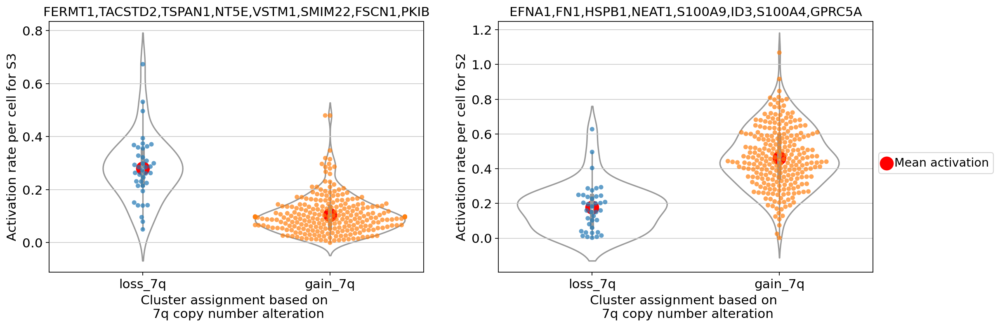

In [797]:
plot_distr_2(data_c1 =data_lung, full_R_c1 =full_R_lung, 
           name1 = "cna_cluster_7q_cat", 
           name2 = "cna_cluster_7q_cat",
           p1 = "7q", p2 = "7q")

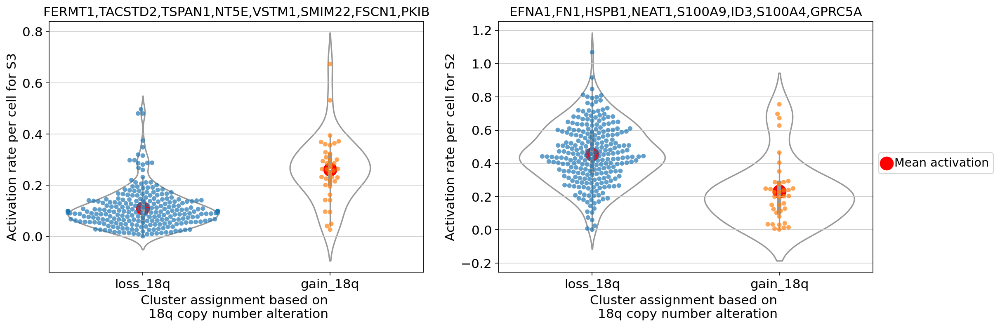

In [806]:
plot_distr_2(data_c1 =data_lung, full_R_c1 =full_R_lung, 
           name1 = "cna_cluster_18q_cat", 
           name2 = "cna_cluster_18q_cat",
           p1 = "18q", p2 = "18q")

### BICR6_UPPER_AERODIGESTIVE_TRACT

In [815]:
data_hn, pval_fisher_hn, full_R_hn = run_cluster(patient_name = 'BICR6_UPPER_AERODIGESTIVE_TRACT')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13790916561773095
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=423078.94	b_div=477782.47	lam=2.63	del=0.99997759	sumW=26783.69	sumH=567.52
nit=  100 K=    2 | obj=-223512.28	b_div=225750.88	lam=0.17	del=0.16638942	sumW=820.72	sumH=339.57
nit=  104 K=    2 | obj=-224159.41	b_div=225344.95	lam=0.17	del=0.01179499	sumW=817.22	sumH=339.27


Clusters: 100%|██████████| 2/2 [00:00<00:00, 73.63it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1


In [816]:
data_hn.obs.to_csv("/mnt/BICR6_UPPER_AERODIGESTIVE_TRACT_analysis.csv")
pval_fisher_hn.to_csv("/mnt/pval_fisher_BICR6_UPPER_AERODIGESTIVE_TRACT.csv")
full_R_hn.to_csv("/mnt/full_R_BICR6_UPPER_AERODIGESTIVE_TRACT.csv")

In [819]:
pval_fisher_hn

,arm,pval,fdr
0,11p,0.266781,0.492169
1,1p,0.369127,0.492169
2,22q,1.000000,1.000000
3,23p,0.230954,0.492169


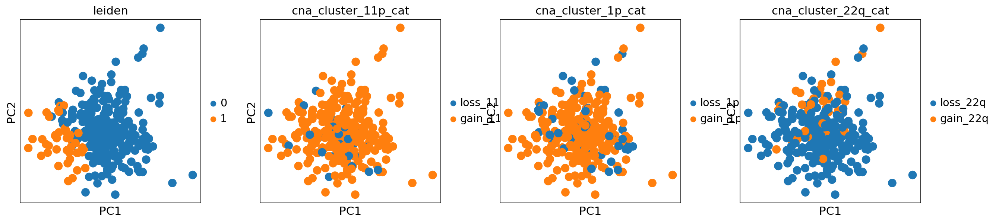

In [820]:
sc.pl.pca(data_hn, color = ['leiden','cna_cluster_11p_cat','cna_cluster_1p_cat','cna_cluster_22q_cat'], ncols= 6)

### HUH28_BILIARY_TRACT

In [769]:
data_bil, pval_fisher_bil, full_R_bil = run_cluster(patient_name = 'HUH28_BILIARY_TRACT')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.14775814104194734
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=193994.47	b_div=252846.58	lam=2.77	del=0.99997878	sumW=32289.57	sumH=282.49
nit=   64 K=    3 | obj=-389327.44	b_div=105010.14	lam=0.12	del=0.01774165	sumW=1128.07	sumH=291.09


Clusters: 100%|██████████| 3/3 [00:00<00:00, 88.82it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2


In [776]:
data_bil.obs.to_csv("/mnt/HUH28_BILIARY_TRACT_analysis.csv")
pval_fisher_bil.to_csv("/mnt/pval_fisher_HUH28_BILIARY_TRACT.csv")
full_R_bil.to_csv("/mnt/full_R_HUH28_BILIARY_TRACT.csv")

In [771]:
pval_fisher_bil[pval_fisher_bil['fdr']<0.1].sort_values(by = "fdr")

,arm,pval,fdr
4,8p,4.376567e-23,2.188284e-22
0,10q,1.426129e-08,3.565323e-08
2,7p,1.855646e-06,3.092743e-06
3,7q,1.563648e-04,1.954560e-04


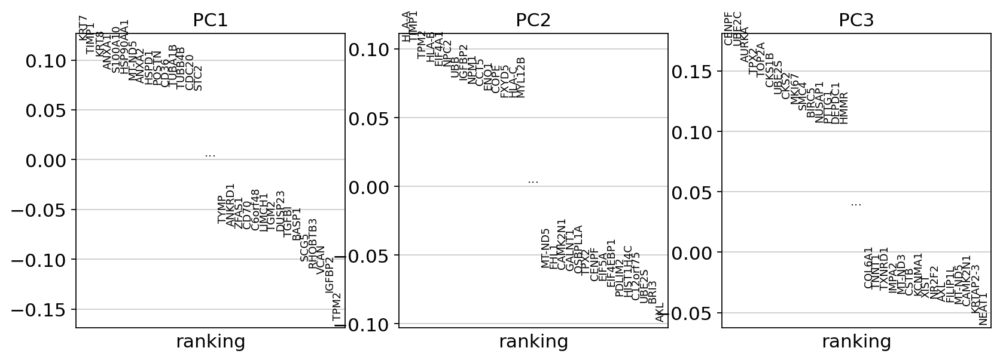

In [777]:
sc.pl.pca_loadings(data_bil)

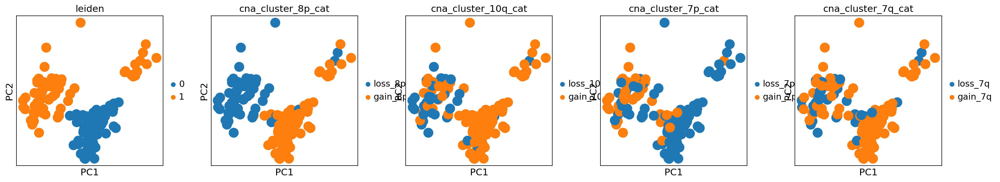

In [775]:
sc.pl.pca(data_bil, color = ['leiden','cna_cluster_8p_cat','cna_cluster_10q_cat','cna_cluster_7p_cat','cna_cluster_7q_cat'], ncols= 6)

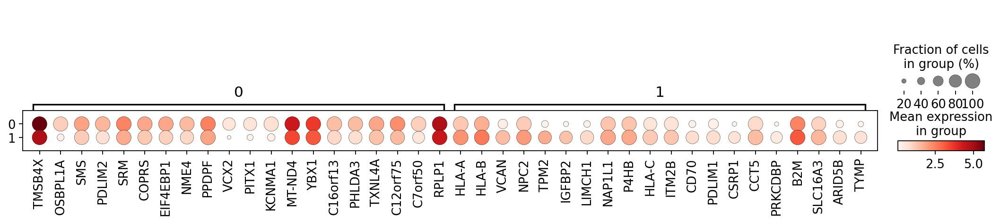

In [778]:
sc.pl.rank_genes_groups_dotplot(data_bil, n_genes=20)

In [848]:
for p in pd.DataFrame(data_bil.uns['rank_genes_groups']['names'])['0'][:30]: ##polyamine biosynthetic process
    print(p)

TMSB4X
OSBPL1A
SMS
PDLIM2
SRM
COPRS
EIF4EBP1
NME4
PPDPF
VCX2
PITX1
KCNMA1
MT-ND4
YBX1
C16orf13
PHLDA3
TXNL4A
C12orf75
C7orf50
RPLP1
MT-CO2
GTPBP6
AP3S1
MT-ND5
PRELID1
BRI3
C4orf48
FGFR1
MT2A
TPGS2


In [847]:
for p in pd.DataFrame(data_bil.uns['rank_genes_groups']['names'])['1'][:30]: ##natural killer cell mediated cytotoxicity
    print(p)

HLA-A
HLA-B
VCAN
NPC2
TPM2
IGFBP2
LIMCH1
NAP1L1
P4HB
HLA-C
ITM2B
CD70
PDLIM1
CSRP1
CCT5
PRKCDBP
B2M
SLC16A3
ARID5B
TYMP
RHOBTB3
ID3
PELO
PSAP
ARPC1B
LAMP1
ICAM1
DUSP23
COL8A1
HTRA1


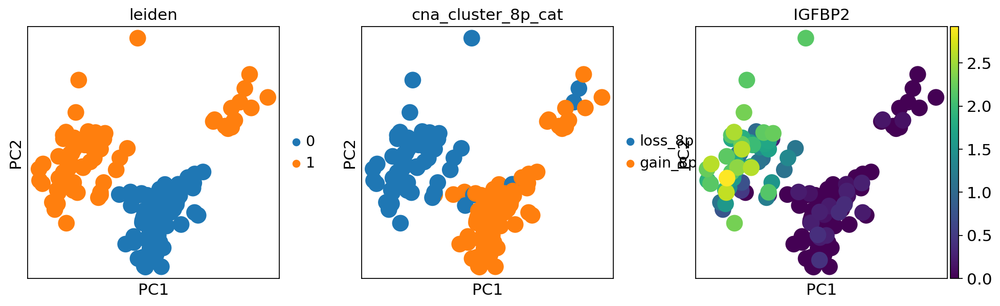

In [851]:
sc.pl.pca(data_bil, color = ['leiden','cna_cluster_8p_cat','IGFBP2'], ncols= 6) ##krt chrom12

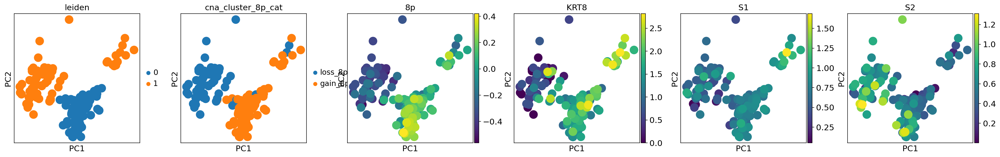

In [783]:
sc.pl.pca(data_bil, color = ['leiden','cna_cluster_8p_cat','8p','KRT8','S1','S2'], ncols= 6) ##krt chrom12

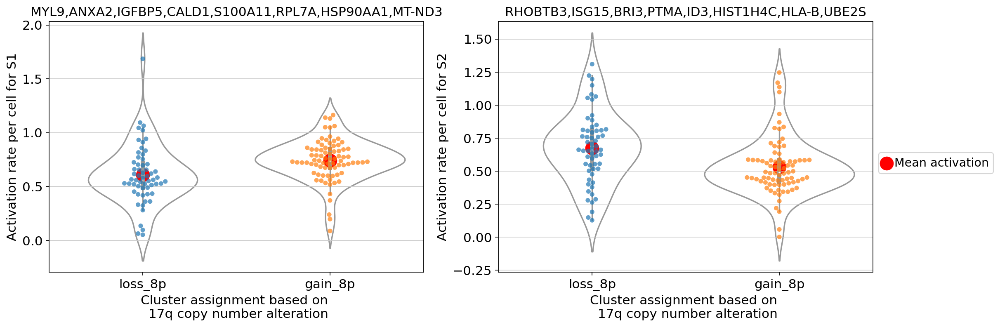

In [781]:
plot_distr(data_c1 =data_bil, full_R_c1 =full_R_bil, 
           name1 = "cna_cluster_8p_cat", 
           name2 = "cna_cluster_8p_cat",
           p1 = "17q", p2 = "17q")

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 16.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


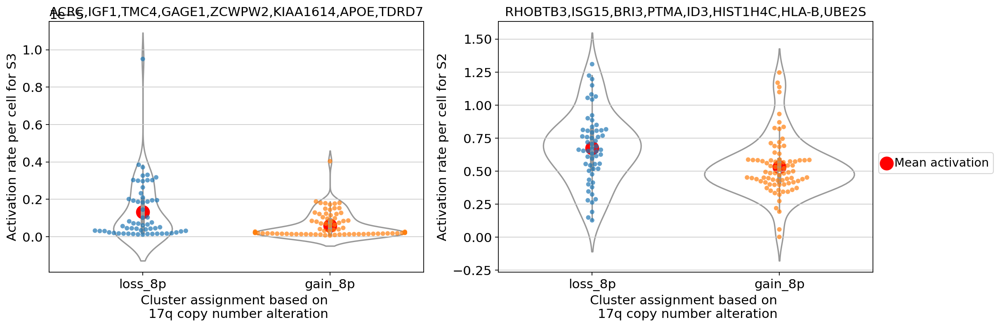

In [849]:
plot_distr_2(data_c1 =data_bil, full_R_c1 =full_R_bil, 
           name1 = "cna_cluster_8p_cat", 
           name2 = "cna_cluster_8p_cat",
           p1 = "17q", p2 = "17q")

### OSRC2_KIDNEY

In [741]:
data_kidney, pval_fisher_kidney, full_R_kidney = run_cluster(patient_name = 'OSRC2_KIDNEY')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.14609819130409218
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=141252.22	b_div=185359.91	lam=2.87	del=0.99997276	sumW=24909.85	sumH=255.40
nit=   68 K=    2 | obj=-307022.81	b_div=81109.68	lam=0.12	del=0.01830433	sumW=616.63	sumH=187.91


Clusters: 100%|██████████| 2/2 [00:00<00:00, 112.41it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1


In [765]:
data_kidney.obs.to_csv("/mnt/OSRC2_KIDNEY_analysis.csv")
pval_fisher_kidney.to_csv("/mnt/pval_fisher_OSRC2_KIDNEY.csv")
full_R_kidney.to_csv("/mnt/full_R_OSRC2_KIDNEY.csv")

In [743]:
pval_fisher_kidney[pval_fisher_kidney['fdr']<0.1]

,arm,pval,fdr
0,12q,1.477496e-04,1.477496e-04
1,17q,9.358997e-13,1.871799e-12
2,19p,8.774883e-18,3.509953e-17
3,9q,1.037907e-06,1.383876e-06


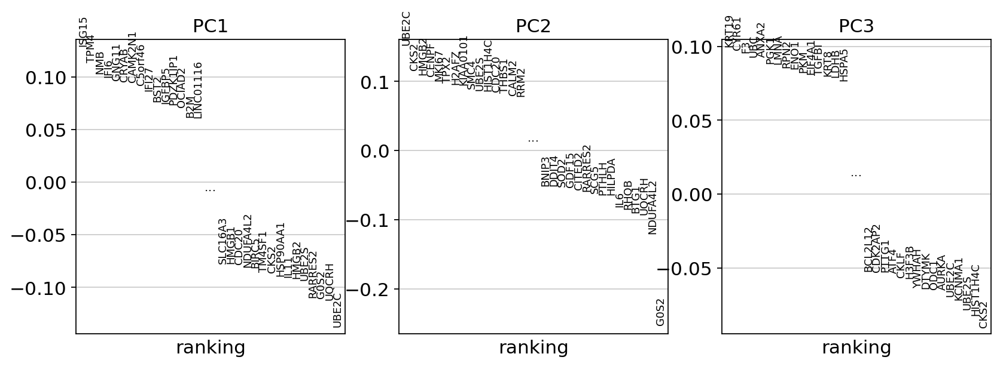

In [745]:
sc.pl.pca_loadings(data_kidney)

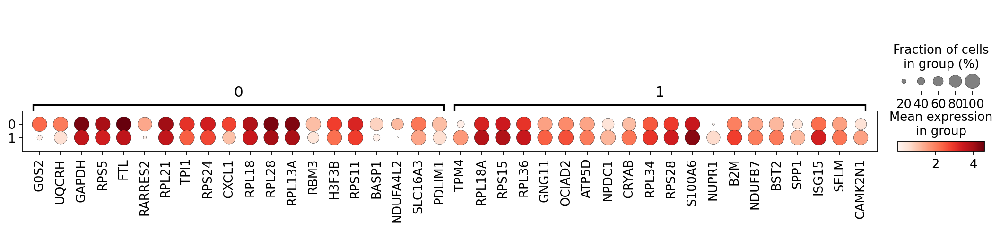

In [746]:
sc.pl.rank_genes_groups_dotplot(data_kidney, n_genes=20)

In [859]:
for g in pd.DataFrame(data_kidney.uns['rank_genes_groups']['names'])['0'][:30]: ##cytoplasmic translaation 
    print(g)

G0S2
UQCRH
GAPDH
RPS5
FTL
RARRES2
RPL21
TPI1
RPS24
CXCL1
RPL18
RPL28
RPL13A
RBM3
H3F3B
RPS11
BASP1
NDUFA4L2
SLC16A3
PDLIM1
TPT1
ACTG1
FTH1
HMGB1
BNIP3
RPSA
LDHA
PHB
RPL8
RPS25


In [860]:
for g in pd.DataFrame(data_kidney.uns['rank_genes_groups']['names'])['1'][:30]: ##cytoplasmic translaation 
    print(g)

TPM4
RPL18A
RPS15
RPL36
GNG11
OCIAD2
ATP5D
NPDC1
CRYAB
RPL34
RPS28
S100A6
NUPR1
B2M
NDUFB7
BST2
SPP1
ISG15
SELM
CAMK2N1
IFI6
NMB
MRPL41
ATPIF1
LINC01116
TOMM7
GADD45GIP1
HLA-B
CTSZ
C19orf53


In [747]:
data_kidney.obs.columns

Index(['Barcode', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'CCLE_ID', 'index.1', 'cancer_type', 'pool_id',
       'n_cells', 'cancer_type_trunc', 'S1', 'S2', 'logS1', 'logS2', 'leiden',
       'cna_cluster_12q', 'cna_cluster_17q', 'cna_cluster_19p',
       'cna_cluster_9q', 'cna_cluster_12q_cat', 'cna_cluster_17q_cat',
       'cna_cluster_19p_cat', 'cna_cluster_9q_cat', '10p', '10q', '11p', '11q',
       '12p', '12q', '13q', '14q', '15q', '16p', '16q', '17p', '17q', '18p',
       '18q', '19p', '19q', '1p', '1q', '20p', '20q', '21q', '22q', '23p',
       '23q', '2p', '2q', '3p', '3q', '4p', '4q', '5p', '5q', '6p', '6q', '7p',
       '7q', '8p', '8q', '9p', '9q'],
      dtype='object')

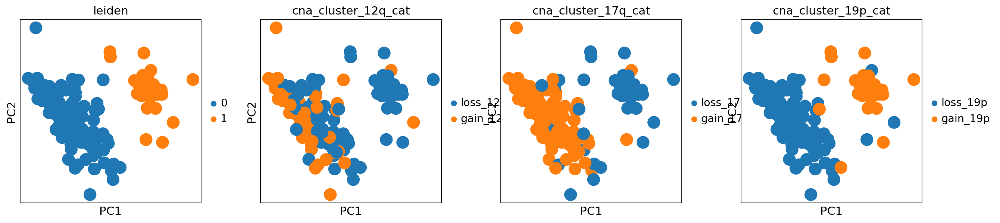

In [750]:
sc.pl.pca(data_kidney, color = ['leiden','cna_cluster_12q_cat','cna_cluster_17q_cat','cna_cluster_19p_cat'], ncols= 6)

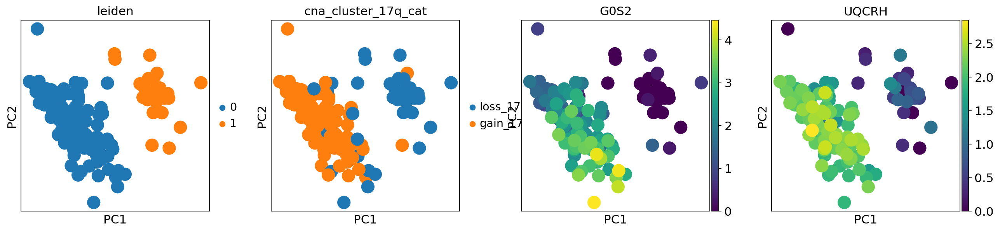

In [754]:
sc.pl.pca(data_kidney, color = ['leiden','cna_cluster_17q_cat','G0S2','UQCRH'], ncols= 6)

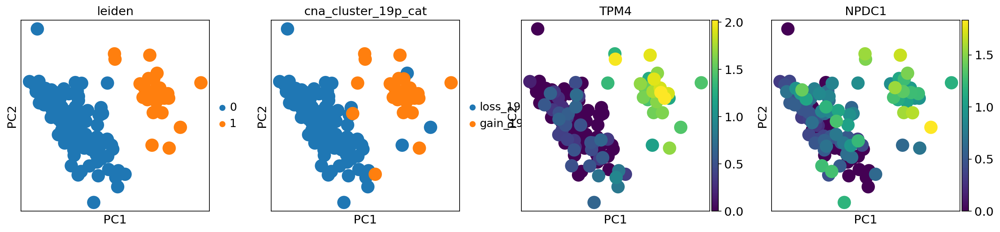

In [757]:
sc.pl.pca(data_kidney, color = ['leiden','cna_cluster_19p_cat','TPM4','NPDC1'], ncols= 6)

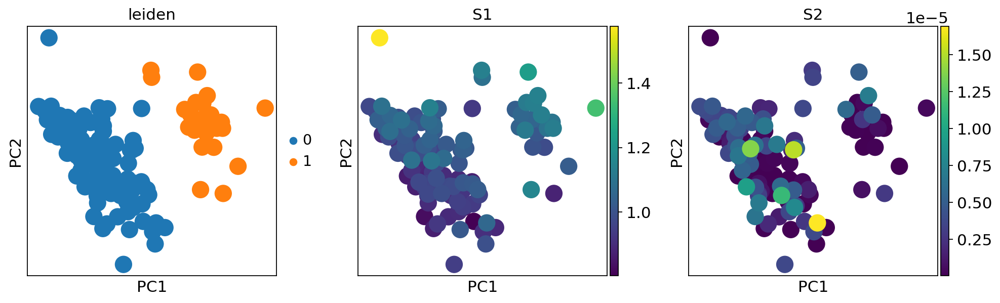

In [751]:
sc.pl.pca(data_kidney, color = ['leiden','S1','S2'], ncols= 6)

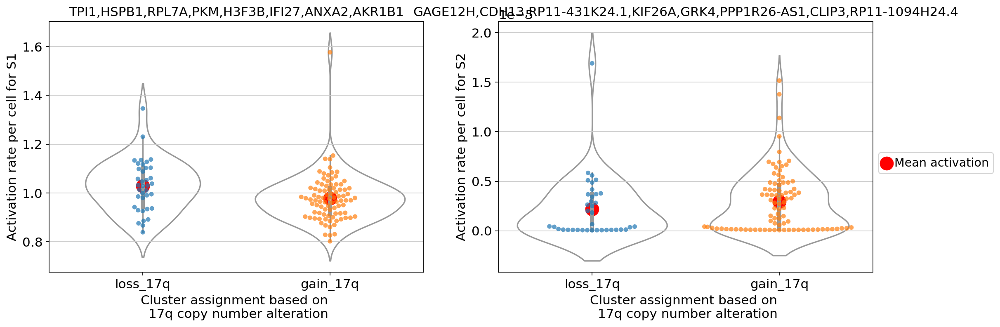

In [752]:
plot_distr(data_c1 =data_kidney, full_R_c1 =full_R_kidney, 
           name1 = "cna_cluster_17q_cat", 
           name2 = "cna_cluster_17q_cat",
           p1 = "17q", p2 = "17q")

### MDAMB436_BREAST

In [716]:
data_brca, pval_fisher_brca, full_R_brca = run_cluster(patient_name = 'MDAMB436_BREAST')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13763505456104802
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=384862.19	b_div=425045.31	lam=3.05	del=0.99997407	sumW=24236.81	sumH=554.77
nit=   83 K=    3 | obj=-182294.72	b_div=182425.41	lam=0.20	del=0.01710471	sumW=1006.53	sumH=434.46


Clusters: 100%|██████████| 3/3 [00:00<00:00, 80.91it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2


In [766]:
data_brca.obs.to_csv("/mnt/MDAMB436_BREAST_analysis.csv")
pval_fisher_brca.to_csv("/mnt/pval_fisher_MDAMB436_BREAST.csv")
full_R_brca.to_csv("/mnt/full_R_MDAMB436_BREAST.csv")

In [861]:
pval_fisher_brca[pval_fisher_brca['fdr']<0.1].sort_values(by = "fdr")

,arm,pval,fdr
4,3p,6.680494e-52,4.008296e-51
5,7p,9.544712e-51,2.863414e-50
3,2q,2.300807e-50,4.601614e-50
1,16p,7.274438e-50,1.091166e-49
0,13q,3.817226e-26,4.580671e-26
2,19p,7.215930e-07,7.215930e-07


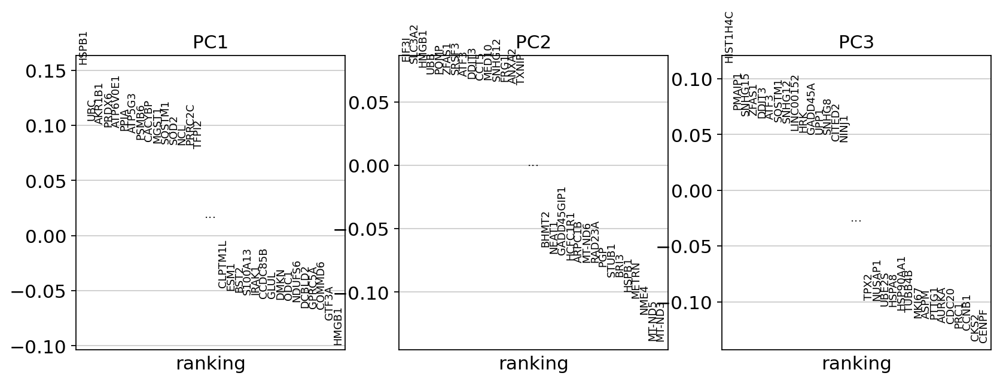

In [718]:
sc.pl.pca_loadings(data_brca)

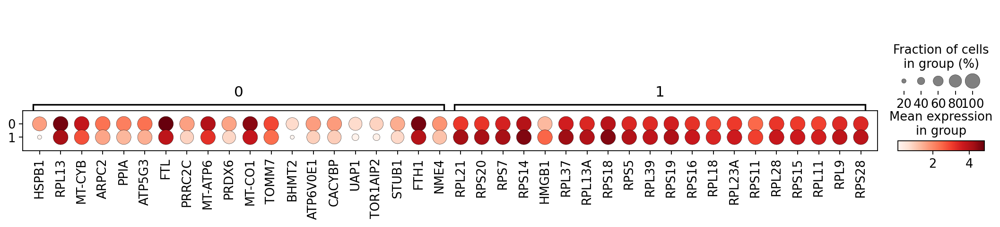

In [719]:
sc.pl.rank_genes_groups_dotplot(data_brca, n_genes=20)

In [721]:
data_brca.obs.columns

Index(['Barcode', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'CCLE_ID', 'index.1', 'cancer_type', 'pool_id',
       'n_cells', 'cancer_type_trunc', 'S1', 'S2', 'S3', 'logS1', 'logS2',
       'logS3', 'leiden', 'cna_cluster_13q', 'cna_cluster_16p',
       'cna_cluster_19p', 'cna_cluster_2q', 'cna_cluster_3p', 'cna_cluster_7p',
       'cna_cluster_13q_cat', 'cna_cluster_16p_cat', 'cna_cluster_19p_cat',
       'cna_cluster_2q_cat', 'cna_cluster_3p_cat', 'cna_cluster_7p_cat', '10p',
       '10q', '11p', '11q', '12p', '12q', '13q', '14q', '15q', '16p', '16q',
       '17p', '17q', '18p', '18q', '19p', '19q', '1p', '1q', '20p', '20q',
       '21q', '22q', '23p', '23q', '2p', '2q', '3p', '3q', '4p', '4q', '5p',
       '5q', '6p', '6q', '7p', '7q', '8p', '8q', '9p', '9q'],
      dtype='object')

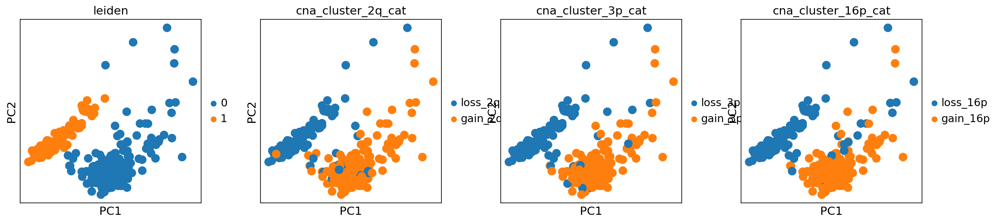

In [736]:
sc.pl.pca(data_brca, color = ['leiden','cna_cluster_2q_cat','cna_cluster_3p_cat','cna_cluster_16p_cat'], ncols= 6)

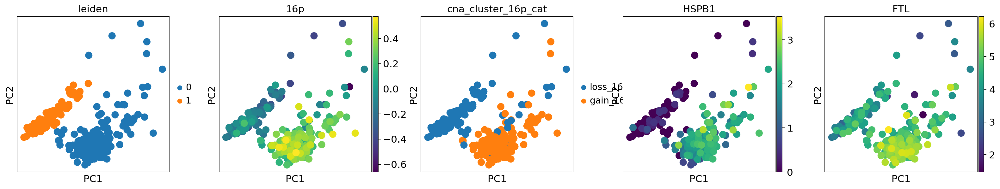

In [726]:
sc.pl.pca(data_brca, color = ['leiden','16p', 'cna_cluster_16p_cat','HSPB1','FTL'], ncols= 6)

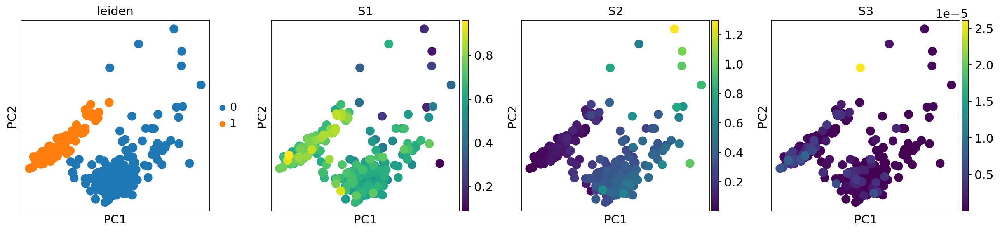

In [728]:
sc.pl.pca(data_brca, color = ['leiden','S1','S2','S3'], ncols= 6)

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 8.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


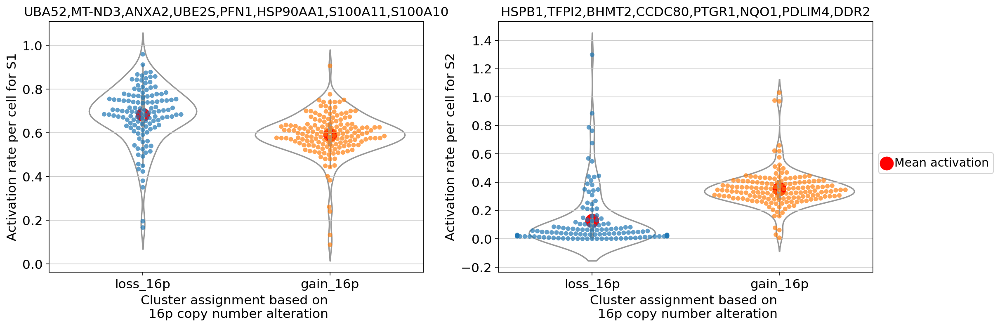

In [733]:
plot_distr(data_c1 =data_brca, full_R_c1 =full_R_brca, 
           name1 = "cna_cluster_16p_cat", 
           name2 = "cna_cluster_16p_cat",
           p1 = "16p", p2 = "16p")

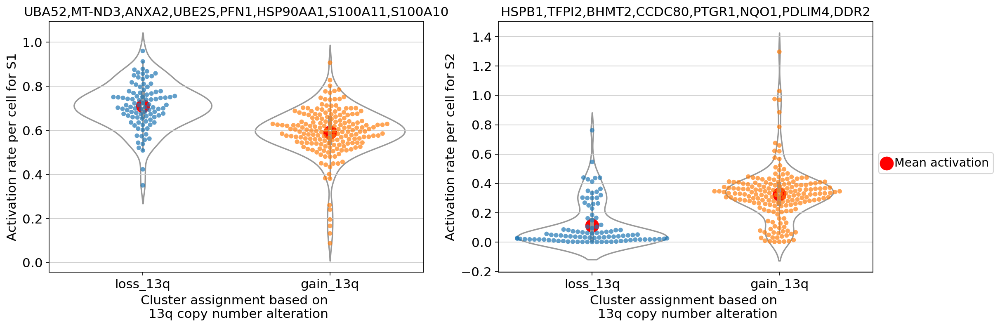

In [734]:
plot_distr(data_c1 =data_brca, full_R_c1 =full_R_brca, 
           name1 = "cna_cluster_13q_cat", 
           name2 = "cna_cluster_13q_cat",
           p1 = "13q", p2 = "13q")

### SW1088_CENTRAL_NERVOUS_SYSTEM

In [713]:
data_c1, pval_fisher, full_R_c1 = run_cluster(patient_name = 'SW1088_CENTRAL_NERVOUS_SYSTEM')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.14238982388027538
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=155859.06	b_div=207008.33	lam=2.74	del=0.99997598	sumW=26978.89	sumH=258.90
nit=   71 K=    2 | obj=-342708.19	b_div=93077.64	lam=0.11	del=0.01854444	sumW=654.23	sumH=194.47


Clusters: 100%|██████████| 2/2 [00:00<00:00, 103.18it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1


In [767]:
data_c1.obs.to_csv("/mnt/SW1088_CENTRAL_NERVOUS_SYSTEM_analysis.csv")
pval_fisher.to_csv("/mnt/pval_fisher_SW1088_CENTRAL_NERVOUS_SYSTEM.csv")
full_R_c1.to_csv("/mnt/full_R_SW1088_CENTRAL_NERVOUS_SYSTEM.csv")

In [690]:
pval_fisher[pval_fisher['fdr']<0.1]

,arm,pval,fdr
1,3p,2.591822e-19,7.775465e-19
2,5p,1.570442e-14,2.355664e-14
3,5q,1.031235e-23,6.187410e-23
4,7p,1.315012e-16,2.630024e-16


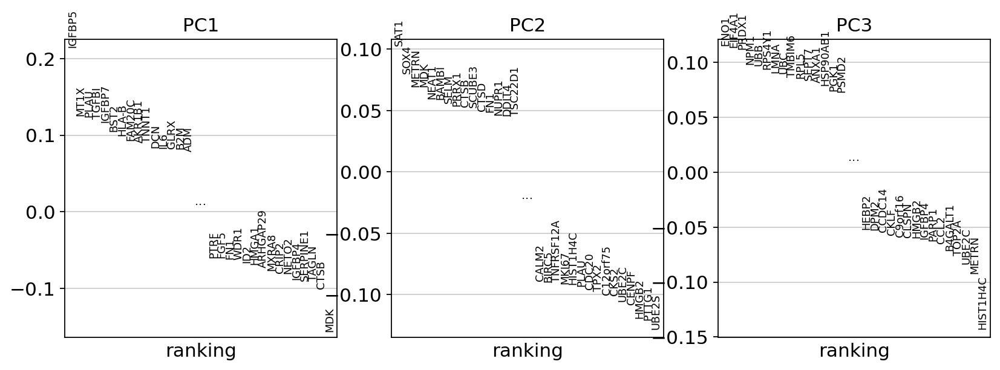

In [686]:
sc.pl.pca_loadings(data_c1)

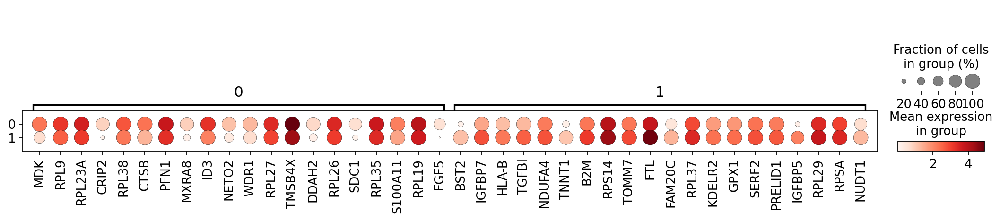

In [687]:
sc.pl.rank_genes_groups_dotplot(data_c1, n_genes=20)

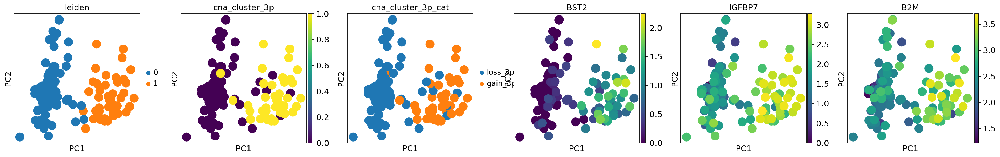

In [696]:
sc.pl.pca(data_c1, color = ['leiden','cna_cluster_3p', 'cna_cluster_3p_cat','BST2','IGFBP7','B2M'], ncols= 6)

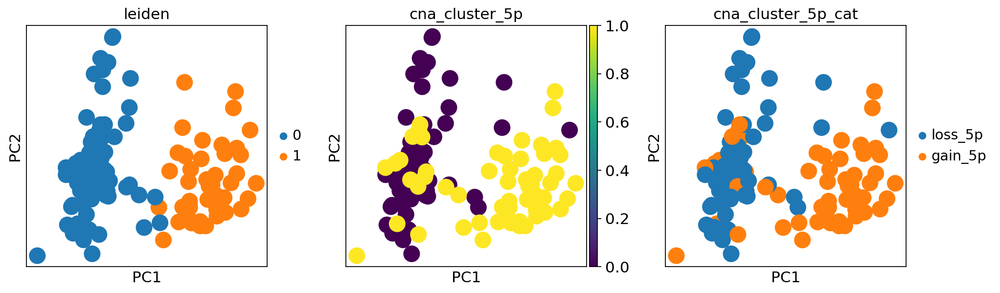

In [681]:
sc.pl.pca(data_c1, color = ['leiden','cna_cluster_5p', 'cna_cluster_5p_cat',], ncols= 6)

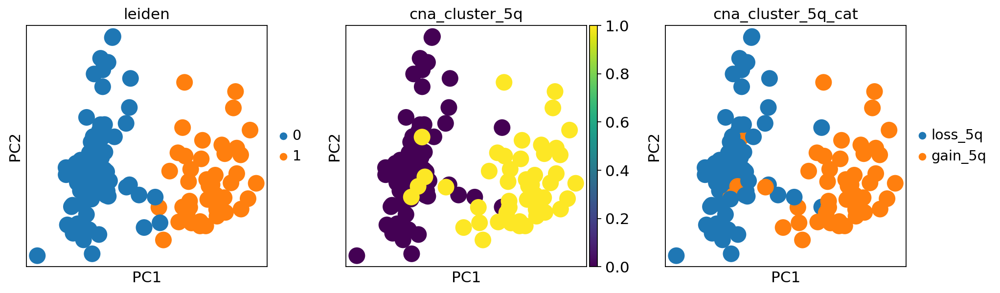

In [682]:
sc.pl.pca(data_c1, color = ['leiden','cna_cluster_5q', 'cna_cluster_5q_cat',], ncols= 6)

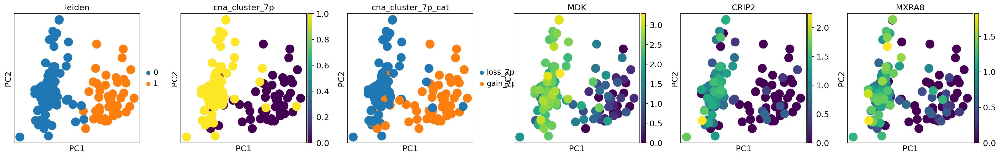

In [702]:
sc.pl.pca(data_c1, color = ['leiden','cna_cluster_7p', 'cna_cluster_7p_cat', 'MDK','CRIP2','MXRA8'], ncols= 6)

/opt/conda/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 10.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


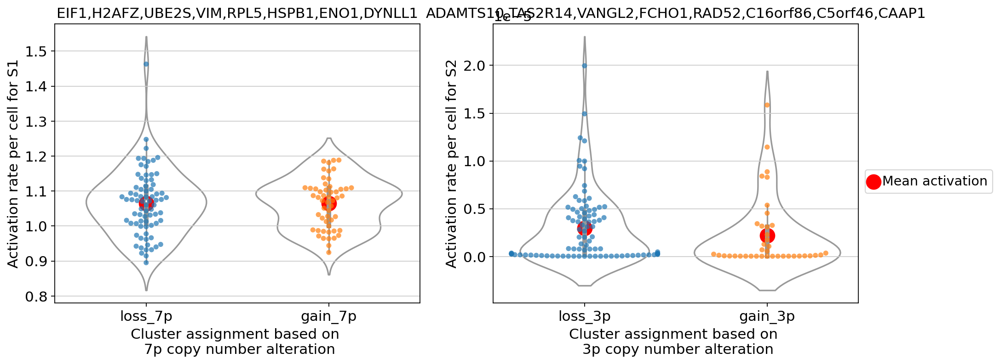

In [715]:
fig, ax = plt.subplots(1,2,figsize=(14,5))


sns.violinplot(ax = ax[0], data = data_c1.obs ,x = "cna_cluster_7p_cat", y ="S1", color = "white", alpha = 0.4)
sns.swarmplot(ax = ax[0], data = data_c1.obs ,x = "cna_cluster_7p_cat", y ="S1", alpha= 0.7)
ax[0].set_title(",".join(list(full_R_c1.sort_values(by = "S1",ascending = False).index[:8])))
ax[0].set_ylabel("Activation rate per cell for S1")

ax[0].scatter(
                x=0, 
                y=data_c1.obs.groupby(by = "cna_cluster_7p_cat").mean()['S1'][0], 
                color='r', s = 200, label = "Mean activation")
ax[0].scatter(
                x=1, 
                y=data_c1.obs.groupby(by = "cna_cluster_7p_cat").mean()['S1'][1], 
                color='r', s = 200)

sns.violinplot(ax = ax[1],data = data_c1.obs ,x = "cna_cluster_3p_cat", y ="S2", color = "white",alpha = 0.4)
sns.swarmplot(ax = ax[1],data = data_c1.obs ,x = "cna_cluster_3p_cat", y ="S2", alpha = 0.7)
ax[1].set_title(",".join(list(full_R_c1.sort_values(by = "S2",ascending = False).index[:8])))
ax[1].set_ylabel("Activation rate per cell for S2")
ax[1].scatter(
                x=0, 
                y=data_c1.obs.groupby(by = "cna_cluster_3p_cat").mean()['S2'][0], 
                color='r', s = 200, label = "Mean activation")
ax[1].scatter(
                x=1, 
                y=data_c1.obs.groupby(by = "cna_cluster_3p_cat").mean()['S2'][1], 
                color='r', s = 200)

ax[0].set_xlabel("Cluster assignment based on \n 7p copy number alteration")
ax[1].set_xlabel("Cluster assignment based on \n 3p copy number alteration")

ax[1].legend(loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()

### CCFSTTG1_CENTRAL_NERVOUS_SYSTEM

In [1050]:
datac, pval_fisherc, full_Rc= run_cluster(patient_name = 'CCFSTTG1_CENTRAL_NERVOUS_SYSTEM')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13204687134507237
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=355153.69	b_div=403249.56	lam=2.76	del=0.99997699	sumW=24870.67	sumH=477.49
nit=   50 K=    4 | obj=-190147.48	b_div=191533.28	lam=0.19	del=0.01498429	sumW=1256.68	sumH=473.93


Clusters: 100%|██████████| 4/4 [00:00<00:00, 88.07it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
3


In [1051]:
datac.obs.to_csv("/mnt/CCFSTTG1_CENTRAL_NERVOUS_SYSTEM_analysis.csv")
pval_fisherc.to_csv("/mnt/pval_fisher_CCFSTTG1_CENTRAL_NERVOUS_SYSTEM.csv")
full_Rc.to_csv("/mnt/full_R_CCFSTTG1_CENTRAL_NERVOUS_SYSTEM.csv")

In [1052]:
pval_fisherc

,arm,pval,fdr
0,3p,9.718469e-09,9.718469e-09
1,6q,6.016165e-46,1.203233e-45


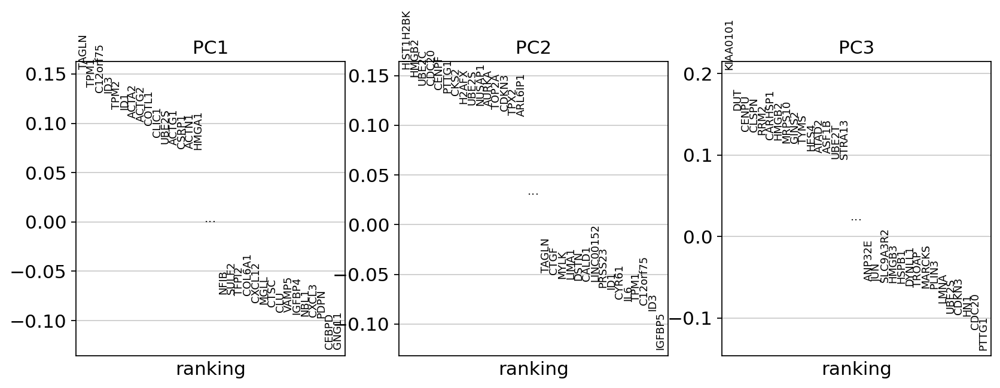

In [631]:
sc.pl.pca_loadings(data)

... storing 'cna_cluster_3p_cat' as categorical
... storing 'cna_cluster_6q_cat' as categorical


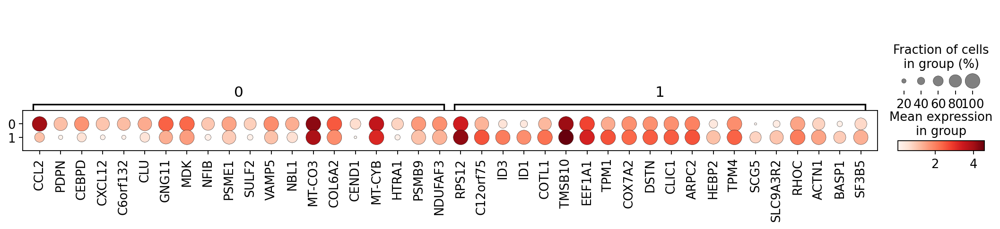

In [632]:
sc.pl.rank_genes_groups_dotplot(data, n_genes=20)

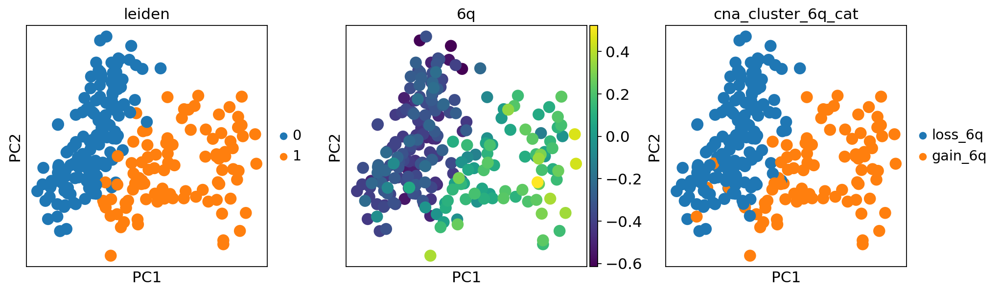

In [645]:
sc.pl.pca(data, color = ['leiden','6q', 'cna_cluster_6q_cat'], ncols= 6)

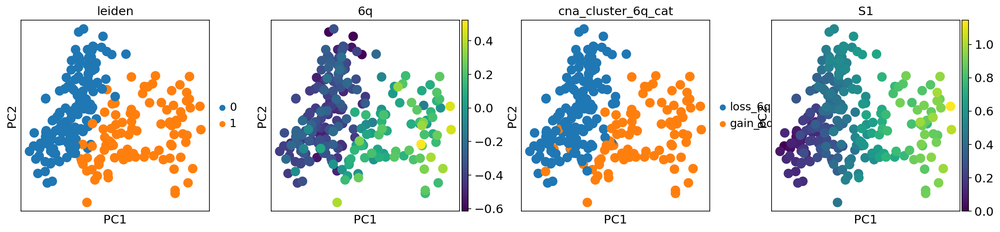

In [805]:
sc.pl.pca(data, color = ['leiden','6q', 'cna_cluster_6q_cat','S1'], ncols= 6)

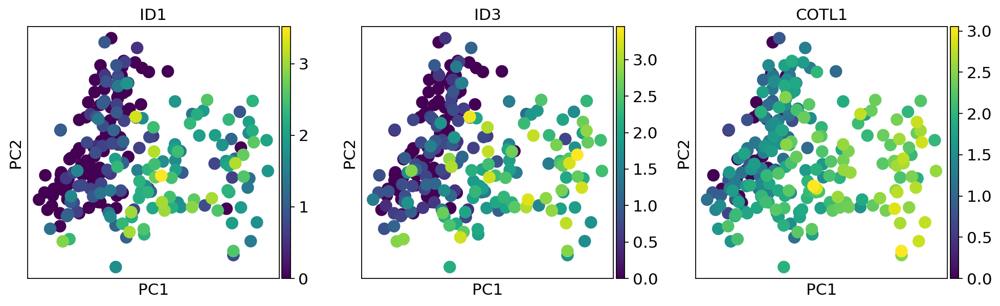

In [646]:
sc.pl.pca(data, color = ['ID1','ID3','COTL1'], ncols= 6)

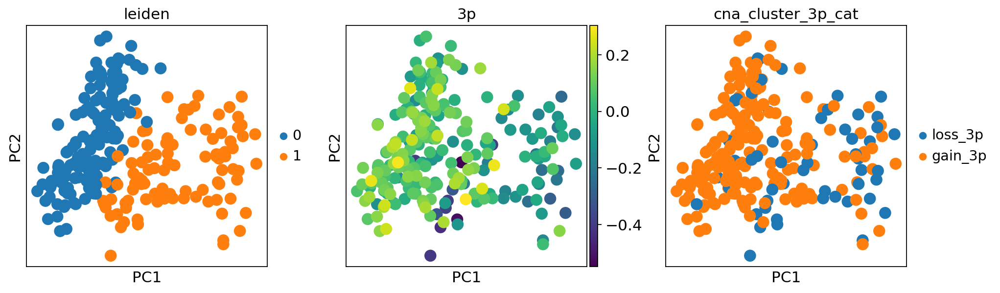

In [647]:
sc.pl.pca(data, color = ['leiden','3p', 'cna_cluster_3p_cat'], ncols= 6)

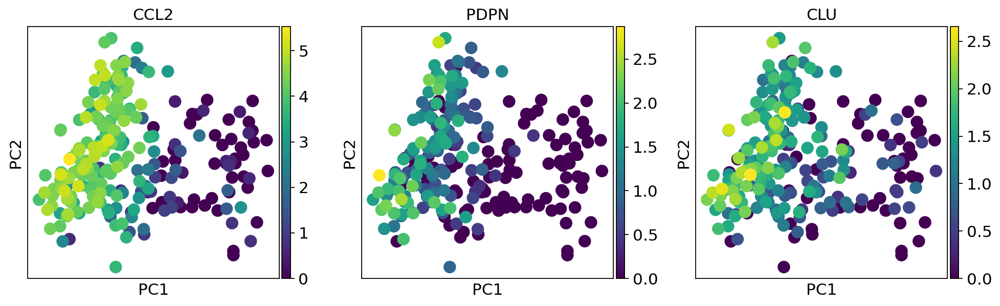

In [648]:
sc.pl.pca(data, color = ['CCL2','PDPN','CLU'], ncols = 6)

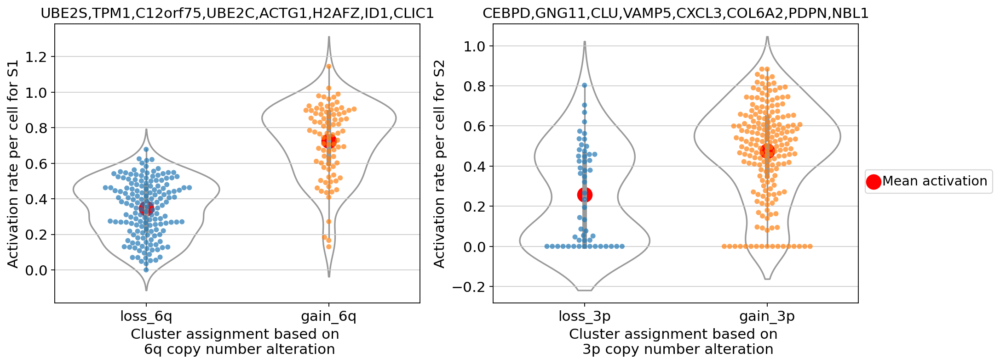

In [649]:
fig, ax = plt.subplots(1,2,figsize=(14,5))


sns.violinplot(ax = ax[0], data = data.obs ,x = "cna_cluster_6q_cat", y ="S1", color = "white", alpha = 0.4)
sns.swarmplot(ax = ax[0], data = data.obs ,x = "cna_cluster_6q_cat", y ="S1", alpha= 0.7)
ax[0].set_title(",".join(list(full_R.sort_values(by = "S1",ascending = False).index[:8])))
ax[0].set_ylabel("Activation rate per cell for S1")

ax[0].scatter(
                x=0, 
                y=data.obs.groupby(by = "cna_cluster_6q_cat").mean()['S1'][0], 
                color='r', s = 200, label = "Mean activation")
ax[0].scatter(
                x=1, 
                y=data.obs.groupby(by = "cna_cluster_6q_cat").mean()['S1'][1], 
                color='r', s = 200)

sns.violinplot(ax = ax[1],data = data.obs ,x = "cna_cluster_3p_cat", y ="S2", color = "white",alpha = 0.4)
sns.swarmplot(ax = ax[1],data = data.obs ,x = "cna_cluster_3p_cat", y ="S2", alpha = 0.7)
ax[1].set_title(",".join(list(full_R.sort_values(by = "S2",ascending = False).index[:8])))
ax[1].set_ylabel("Activation rate per cell for S2")
ax[1].scatter(
                x=0, 
                y=data.obs.groupby(by = "cna_cluster_3p_cat").mean()['S2'][0], 
                color='r', s = 200, label = "Mean activation")
ax[1].scatter(
                x=1, 
                y=data.obs.groupby(by = "cna_cluster_3p_cat").mean()['S2'][1], 
                color='r', s = 200)

ax[0].set_xlabel("Cluster assignment based on \n 6q copy number alteration")
ax[1].set_xlabel("Cluster assignment based on \n 3p copy number alteration")

ax[1].legend(loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()

In [661]:
### chromsome arms of genes 
rna_loc = pd.read_csv("NCIH1568_LUNG_copykat_CNA_raw_results_gene_by_cell.txt",sep="\t")
rna_location = rna_loc[['hgnc_symbol','band','chromosome_name']]

In [669]:
rna_location[rna_location['hgnc_symbol'].isin(['ID3','ID1','CXCL3','CEBPD','GNG11','CLU']) ] 

,hgnc_symbol,band,chromosome_name
85,ID3,p36.12,1
2251,CLU,p21.1,8
2286,CEBPD,q11.21,8
4978,ID1,q11.21,20


In [656]:
for p in full_R.sort_values(by = "S1",ascending = False).index[:30]: ###free ubiquitin chain polymerization (chrom 20, cell cycle) ##ID1,3 glioblastoma related 
    print(p)

UBE2S
TPM1
C12orf75
UBE2C
ACTG1
H2AFZ
ID1
CLIC1
ID3
HMGB1
TUBB
COTL1
VIM
BYSL
CENPF
PTTG1
ARPC2
TPM4
DYNLL1
CALM2
H3F3B
HMGA1
RPS4X
DSTN
PKM
TNFRSF12A
ENO1
HMGB2
TUBB4B
HMGN2


In [657]:
for p in full_R.sort_values(by = "S2",ascending = False).index[:30]:
    print(p)

CEBPD
GNG11
CLU
VAMP5
CXCL3
COL6A2
PDPN
NBL1
MGLL
COL6A1
MDK
IGFBP4
TOMM7
CTSC
C6orf132
NFIB
AKR1B1
TFPI2
PSME2
CXCL12
CHCHD10
FAM20C
TXN
RAB13
PKM
RPS4X
UBE2L6
SOD2
MDM2
PHLDA1


### Compare programs across cancer types

In [924]:
run = ['NCIH1568_LUNG','BICR6_UPPER_AERODIGESTIVE_TRACT', 'HUH28_BILIARY_TRACT','OSRC2_KIDNEY', 'MDAMB436_BREAST','CCFSTTG1_CENTRAL_NERVOUS_SYSTEM']

In [1066]:
gather = []
for p in cancer_type_cluster_df[cancer_type_cluster_df['subtype'] == True]['patient'].unique():
    
    fpval_fisher = pd.read_csv(f"/mnt/pval_fisher_{p}.csv")
    fpval_fisher['cancer_type'] = list(cancer_type_cluster_df[cancer_type_cluster_df['patient'] == p ]['cancer_type'])[0]
    fpval_fisher['name'] = p
    
    gather.append(fpval_fisher)

In [1053]:
gather = []
for f,name,type_ in zip([pval_fisher_lung, pval_fisher_bil, pval_fisher_hn, pval_fisher_kidney, pval_fisher_brca ,pval_fisherc], 
                        ['NCIH1568_LUNG','BICR6_UPPER_AERODIGESTIVE_TRACT', 'HUH28_BILIARY_TRACT','OSRC2_KIDNEY', 'MDAMB436_BREAST', 'CCFSTTG1_CENTRAL_NERVOUS_SYSTEM'],
                        ['Lung Cancer', 'Bileduct Cancer','Head and Neck Cancer','Kidney Cancer','Breast Cancer', 'Brain Cancer', 'Brain Cancer']):
    
    f['cancer_type'] = type_
    f['name'] = name
    gather.append(f)

In [964]:
pval_fisher_hn['name'] = 'BICR6_UPPER_AERODIGESTIVE_TRACT'
pval_fisher_bil['name'] = 'HUH28_BILIARY_TRACT'

In [1054]:
pval_fisherc

,arm,pval,fdr,cancer_type,name
0,3p,9.718469e-09,9.718469e-09,Brain Cancer,CCFSTTG1_CENTRAL_NERVOUS_SYSTEM
1,6q,6.016165e-46,1.203233e-45,Brain Cancer,CCFSTTG1_CENTRAL_NERVOUS_SYSTEM


In [926]:
for p in list(set(cancer_type_cluster_df[cancer_type_cluster_df['subtype'] == True]['patient']) - set(run)):
    
    print(p)
    
    fdata, fpval_fisher, ffull_R= run_cluster(patient_name = p)
    
    fdata.obs.to_csv(f"/mnt/{p}_analysis.csv")
    fpval_fisher.to_csv(f"/mnt/pval_fisher_{p}.csv")
    ffull_R.to_csv(f"/mnt/full_R_{p}.csv")
    
    
    fpval_fisher['cancer_type'] = fdata.obs['cancer_type'].unique()[0]
    fpval_fisher['name'] = p
    gather.append(fpval_fisher)
    run.append(p)

SW1088_CENTRAL_NERVOUS_SYSTEM
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.14238982388027538
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=156046.69	b_div=207194.95	lam=2.74	del=0.99997604	sumW=26992.04	sumH=259.10
nit=   58 K=    2 | obj=-342741.16	b_div=93050.09	lam=0.11	del=0.01611342	sumW=657.96	sumH=193.35


Clusters: 100%|██████████| 2/2 [00:00<00:00, 104.24it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
COLO741_SKIN
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13822082685567247
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=452099.19	b_div=504894.47	lam=2.58	del=0.99997693	sumW=24668.28	sumH=652.45
nit=   92 K=    3 | obj=-173722.27	b_div=234005.70	lam=0.20	del=0.01775313	sumW=1069.31	sumH=478.20


Clusters: 100%|██████████| 3/3 [00:00<00:00, 85.24it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
NCIH2444_LUNG
normalizing co

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13893555479381708
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=380084.88	b_div=439814.88	lam=2.82	del=0.99998045	sumW=33466.67	sumH=468.30
nit=   40 K=    3 | obj=-323787.50	b_div=173389.00	lam=0.14	del=0.00407123	sumW=1676.00	sumH=479.65


Clusters: 100%|██████████| 3/3 [00:00<00:00, 52.71it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
SNU46_UPPER_AERODIGESTIVE_TRACT
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.12575939105085218
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=318045.09	b_div=377948.94	lam=2.57	del=0.99998003	sumW=29034.59	sumH=446.63
nit=   79 K=    3 | obj=-323142.16	b_div=148195.89	lam=0.15	del=0.00857736	sumW=1130.16	sumH=385.44


Clusters: 100%|██████████| 3/3 [00:00<00:00, 97.29it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
NCIH1435_LUNG
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.15740821110209985
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=417354.12	b_div=468250.38	lam=2.82	del=0.99997604	sumW=27913.44	sumH=565.50
nit=   90 K=    3 | obj=-209395.02	b_div=215580.08	lam=0.19	del=0.01224975	sumW=1231.76	sumH=457.74


Clusters: 100%|██████████| 3/3 [00:00<00:00, 90.53it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
PK45H_PANCREAS
normalizing c

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.14326381093220134
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=472148.28	b_div=535877.88	lam=2.62	del=0.99998057	sumW=31195.67	sumH=544.54
nit=   96 K=    4 | obj=-229057.59	b_div=259778.91	lam=0.17	del=0.01002299	sumW=1611.24	sumH=582.58


Clusters: 100%|██████████| 4/4 [00:00<00:00, 80.79it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.13613602815258116
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=479280.41	b_div=533199.19	lam=2.81	del=0.99997938	sumW=29378.26	sumH=609.71
nit=   81 K=    4 | obj=-222066.25	b_div=217662.70	lam=0.19	del=0.00892064	sumW=1510.18	sumH=611.28


Clusters: 100%|██████████| 4/4 [00:00<00:00, 82.55it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
0
1
2
3
UMUC1_URINARY_TRACT
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
NMF class initalized.
NMF data and parameters set.
   * Using CPU
%%%%%%%%%%%%%%%
a = 10.0
b = 0.1284501643620754
%%%%%%%%%%%%%%%
nit=    0 K=   20 | obj=237128.56	b_div=287570.62	lam=2.63	del=0.99997646	sumW=24609.91	sumH=376.88
nit=   42 K=    3 | obj=-269725.53	b_div=128753.81	lam=0.14	del=0.01341793	sumW=982.82	sumH=320.98


Clusters: 100%|██████████| 3/3 [00:00<00:00, 115.80it/s]
Trying to set attribute `.obs` of view, copying.


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 3
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 1 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray

In [1069]:
gather_df = pd.concat(gather)

In [1070]:
gather_df['Number of chromosomal arms significantly overlap with expression program'] = gather_df['fdr']<0.1

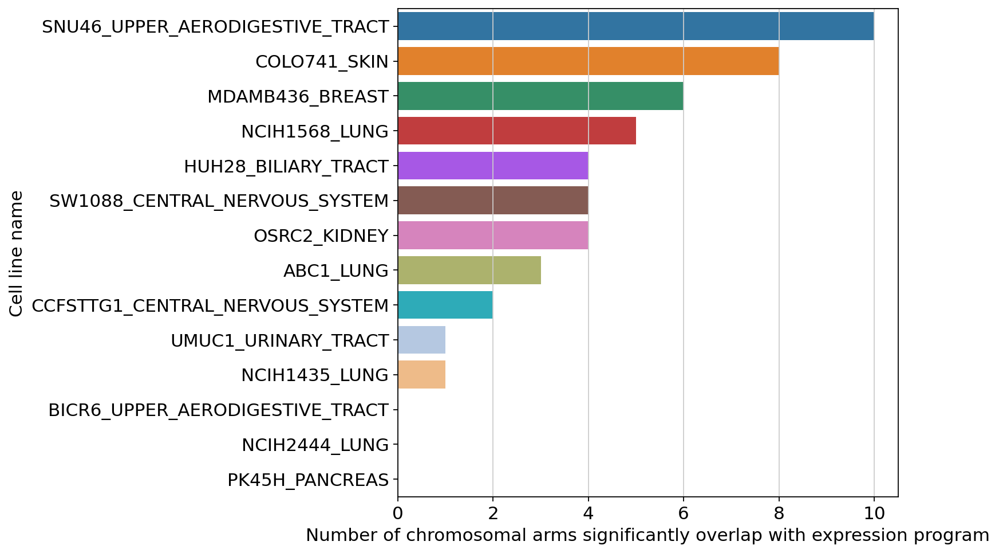

In [1071]:
plt.subplots(figsize= (7,7))
sns.barplot(data= gather_df.groupby(by = ['cancer_type','name']).sum()[['Number of chromosomal arms significantly overlap with expression program']].reset_index().sort_values(by ='Number of chromosomal arms significantly overlap with expression program', ascending = False), 
            x = "Number of chromosomal arms significantly overlap with expression program", y ="name")
plt.ylabel("Cell line name")
plt.show()

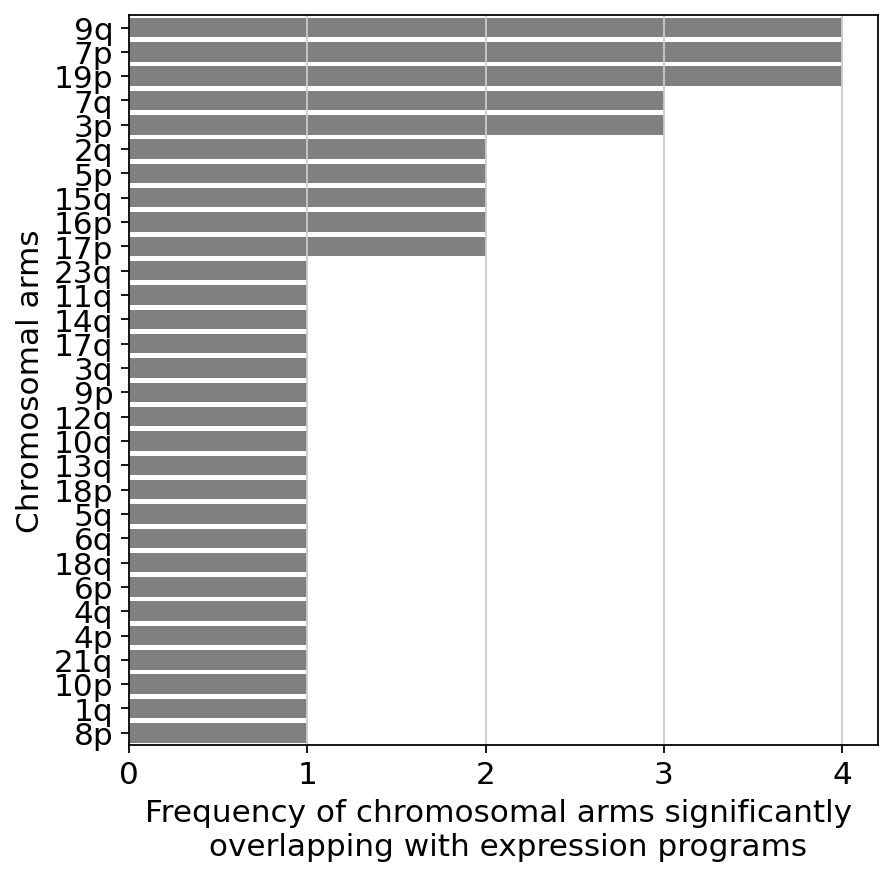

In [1072]:
plt.subplots(figsize= (6,6))
sns.barplot(data = pd.DataFrame.from_dict(Counter(gather_df[gather_df['fdr']<0.1].arm),
                       orient ="index", 
                       columns = ['Frequency of significantly overlap with expression program']).sort_values(by= 'Frequency of significantly overlap with expression program', ascending = False).reset_index(),
            y ="index", x = "Frequency of significantly overlap with expression program", color = 'grey')
plt.ylabel("Chromosomal arms")
plt.xlabel("Frequency of chromosomal arms significantly \n overlapping with expression programs")
plt.show()

In [1073]:
gather_df[(gather_df['fdr']<0.1) & (gather_df['arm'] == "7p")].sort_values(by = "cancer_type")

,Unnamed: 0,arm,pval,fdr,cancer_type,name,Number of chromosomal arms significantly overlap with expression program
2,2,7p,1.855646e-06,3.092743e-06,Bile Duct Cancer,HUH28_BILIARY_TRACT,True
4,4,7p,1.315012e-16,2.630024e-16,Brain Cancer,SW1088_CENTRAL_NERVOUS_SYSTEM,True
5,5,7p,9.544712e-51,2.863414e-50,Breast Cancer,MDAMB436_BREAST,True
6,6,7p,1.003433e-29,3.344777e-29,Head and Neck Cancer,SNU46_UPPER_AERODIGESTIVE_TRACT,True


In [1074]:
gather_df[(gather_df['fdr']<0.1) & (gather_df['arm'] == "19p")].sort_values(by = "cancer_type")

,Unnamed: 0,arm,pval,fdr,cancer_type,name,Number of chromosomal arms significantly overlap with expression program
2,2,19p,7.215930e-07,7.215930e-07,Breast Cancer,MDAMB436_BREAST,True
3,3,19p,1.068964e-06,1.068964e-06,Head and Neck Cancer,SNU46_UPPER_AERODIGESTIVE_TRACT,True
2,2,19p,8.774883e-18,3.509953e-17,Kidney Cancer,OSRC2_KIDNEY,True
2,2,19p,2.213122e-18,2.529282e-18,Skin Cancer,COLO741_SKIN,True


In [1075]:
gather_df[(gather_df['fdr']<0.1) & (gather_df['arm'] == "9q")].sort_values(by = 'cancer_type')

,Unnamed: 0,arm,pval,fdr,cancer_type,name,Number of chromosomal arms significantly overlap with expression program
0,0,9q,2.517740e-02,2.517740e-02,Bladder Cancer,UMUC1_URINARY_TRACT,True
9,9,9q,7.511381e-10,1.073054e-09,Head and Neck Cancer,SNU46_UPPER_AERODIGESTIVE_TRACT,True
3,3,9q,1.037907e-06,1.383876e-06,Kidney Cancer,OSRC2_KIDNEY,True
7,7,9q,7.183608e-39,5.746886e-38,Skin Cancer,COLO741_SKIN,True


In [1077]:
gather_df[(gather_df['fdr']<0.1) & (gather_df['arm'] == "7q")].sort_values(by = 'cancer_type')

,Unnamed: 0,arm,pval,fdr,cancer_type,name,Number of chromosomal arms significantly overlap with expression program
3,3,7q,1.563648e-04,1.954560e-04,Bile Duct Cancer,HUH28_BILIARY_TRACT,True
7,7,7q,3.997744e-35,3.997744e-34,Head and Neck Cancer,SNU46_UPPER_AERODIGESTIVE_TRACT,True
4,4,7q,4.974894e-43,2.487447e-42,Lung Cancer,NCIH1568_LUNG,True


In [1089]:
def reproduce(patient_name):

    data = umi[umi.obs.CCLE_ID == patient_name]

    ########preprocessing data (variable genes)
    sc.pp.normalize_total(data, target_sum=1e4)
    sc.pp.log1p(data)
    sc.pp.highly_variable_genes(data, min_mean=0.01, max_mean=3, min_disp=0.2)

    data.raw = data
    data = data[:,data.var['highly_variable']]
    
    obs = pd.read_csv(f"/mnt/{patient_name}_analysis.csv")
    obs.index=obs['index']
    obs = obs.drop(columns = 'index')
    
    data.obs = obs
    
    data.obs['leiden']= data.obs['leiden'].astype("category")
    sc.tl.pca(data)
    sc.tl.rank_genes_groups(data, groupby='leiden', method='wilcoxon')
    
    return data
    

In [1180]:
data = reproduce('CCFSTTG1_CENTRAL_NERVOUS_SYSTEM')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_3p_cat' as categorical
... storing 'cna_cluster_6q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


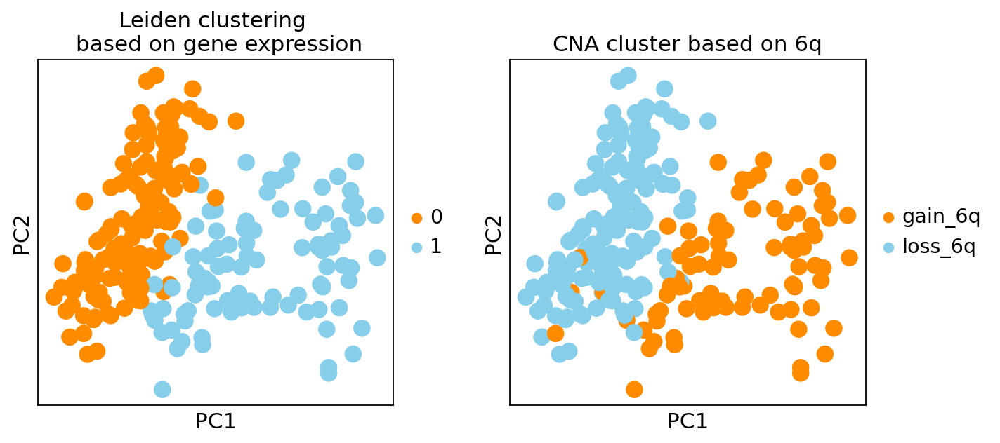

In [1205]:
sc.pl.pca(data, color = ['leiden','cna_cluster_6q_cat',],  
          palette = ['darkorange','skyblue'], title =['Leiden clustering \n based on gene expression','CNA cluster based on 6q'],  ncols= 6)

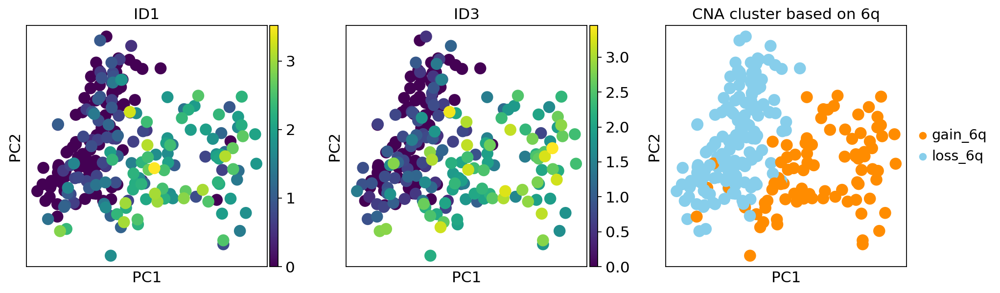

In [1201]:
sc.pl.pca(data, color = ['ID1','ID3','cna_cluster_6q_cat',],  
          palette = ['darkorange','skyblue'], title =['ID1','ID3','CNA cluster based on 6q'],  ncols= 6)

In [1196]:
data1 = reproduce('NCIH1568_LUNG')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_18p_cat' as categorical
... storing 'cna_cluster_18q_cat' as categorical
... storing 'cna_cluster_2q_cat' as categorical
... storing 'cna_cluster_5p_cat' as categorical
... storing 'cna_cluster_7q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


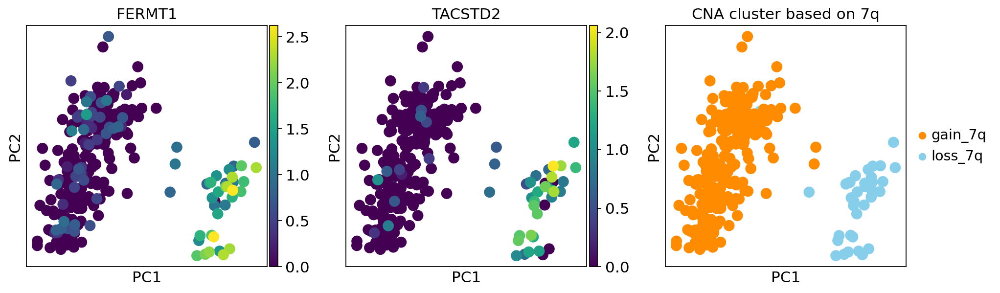

In [1206]:
sc.pl.pca(data1, color = ['FERMT1','TACSTD2', 'cna_cluster_7q_cat',],  
          palette = ['darkorange','skyblue'],
          title =['FERMT1','TACSTD2','CNA cluster based on 7q'], ncols= 6)

RuntimeError: module compiled against API version 0xe but this version of numpy is 0xd

/opt/conda/lib/python3.7/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


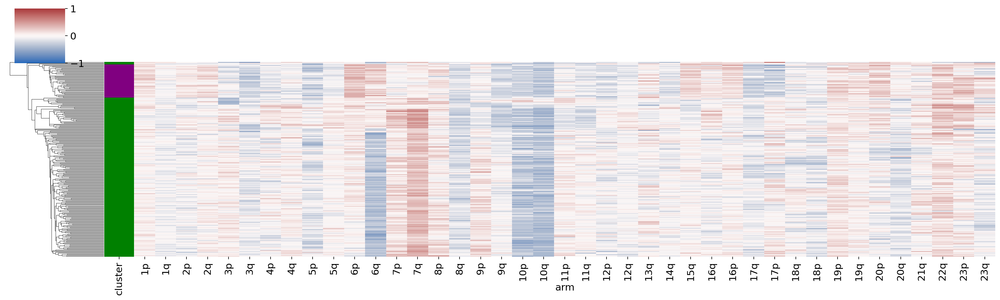

In [1184]:
p = 'CCFSTTG1_CENTRAL_NERVOUS_SYSTEM'

cna = pd.read_csv(f"/mnt/{p}_cna.csv")
cna.index = cna['arm']
cna=cna.drop(columns = ['arm']).T
cna['patient'] = p

process = cna.drop(columns = ['patient']).T
process['arm_number'] = [str.replace(p,'p','') for p in process.index]
process['arm_number'] = [str.replace(p,'q','') for p in process['arm_number']]
process['arm_number'] = [int(f) for f in process['arm_number']]

clustering = AgglomerativeClustering(n_clusters = 2).fit(process.sort_values(by = 'arm_number').drop(columns = ['arm_number']).T)
heatmap = process.sort_values(by = 'arm_number').drop(columns = ['arm_number']).T
heatmap['cluster'] = clustering.labels_
lut1 = dict( zip([0,1], [ 'green','purple']))
row_colors1 = heatmap.cluster.map(lut1)

score = silhouette_score(process.sort_values(by = 'arm_number').drop(columns = ['arm_number']).T, 
                         clustering.labels_)

sns.clustermap(process.sort_values(by = 'arm_number').drop(columns = ['arm_number']).T, 
               col_cluster =  False,
               row_cluster = True,
               yticklabels= False,
               metric = "euclidean", 
               row_colors = row_colors1,
               dendrogram_ratio=(.1, .2),
               xticklabels = process.sort_values(by = 'arm_number').drop(columns = ['arm_number']).T.columns,
               cmap = "vlag", figsize=(20,6), vmax= 1,vmin=-1
              )
plt.show()

In [1090]:
b = reproduce('HUH28_BILIARY_TRACT')
l = reproduce('SW1088_CENTRAL_NERVOUS_SYSTEM')
br = reproduce('MDAMB436_BREAST')
h = reproduce("SNU46_UPPER_AERODIGESTIVE_TRACT")

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_10q_cat' as categorical
... storing 'cna_cluster_15q_cat' as categorical
... storing 'cna_cluster_7p_cat' as categorical
... storing 'cna_cluster_7q_cat' as categorical
... storing 'cna_cluster_8p_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_23q_cat' as categorical
... storing 'cna_cluster_3p_cat' as categorical
... storing 'cna_cluster_5p_cat' as categorical
... storing 'cna_cluster_5q_cat' as categorical
... storing 'cna_cluster_7p_cat' as categorical
... storing 'cna_cluster_8q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_13q_cat' as categorical
... storing 'cna_cluster_16p_cat' as categorical
... storing 'cna_cluster_19p_cat' as categorical
... storing 'cna_cluster_2q_cat' as categorical
... storing 'cna_cluster_3p_cat' as categorical
... storing 'cna_cluster_7p_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_11q_cat' as categorical
... storing 'cna_cluster_14q_cat' as categorical
... storing 'cna_cluster_17p_cat' as categorical
... storing 'cna_cluster_19p_cat' as categorical
... storing 'cna_cluster_23q_cat' as categorical
... storing 'cna_cluster_3q_cat' as categorical
... storing 'cna_cluster_7p_cat' as categorical
... storing 'cna_cluster_7q_cat' as categorical
... storing 'cna_cluster_9p_cat' as categorical
... storing 'cna_cluster_9q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


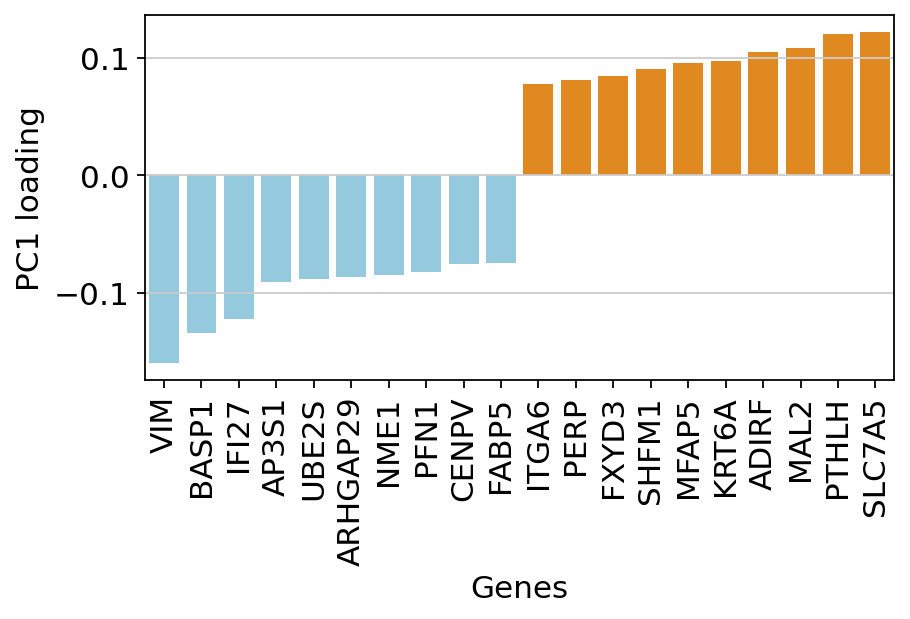

In [1147]:
d = pd.DataFrame(h.varm['PCs'], index = h.var.index).sort_values(by = 0)[:10].append(pd.DataFrame(h.varm['PCs'], index = h.var.index).sort_values(by = 0, ascending = False)[:10]).sort_values(by = 0).reset_index()
d['color'] = 'skyblue'
d.loc[d[0]>0,'color'] = 'darkorange'
plt.subplots(figsize=(6,3))
sns.barplot(data = d, 
            x= "Unnamed: 0", y = 0,
            palette = d['color'])
# sns.barplot(data = d[d[0]>0], x= "Unnamed: 0", y = 0,
#             color = "orange")
plt.xticks(rotation = 90)
plt.xlabel("Genes")
plt.ylabel("PC1 loading")
plt.show()

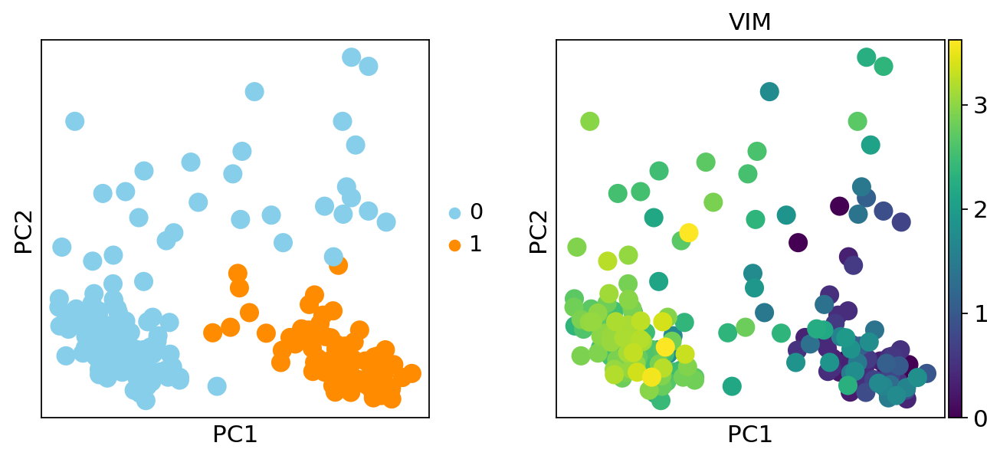

In [1160]:
sc.pl.pca(h, color = ['leiden','VIM'] ,
          palette = ['skyblue' ,'darkorange'], 
          title = "")

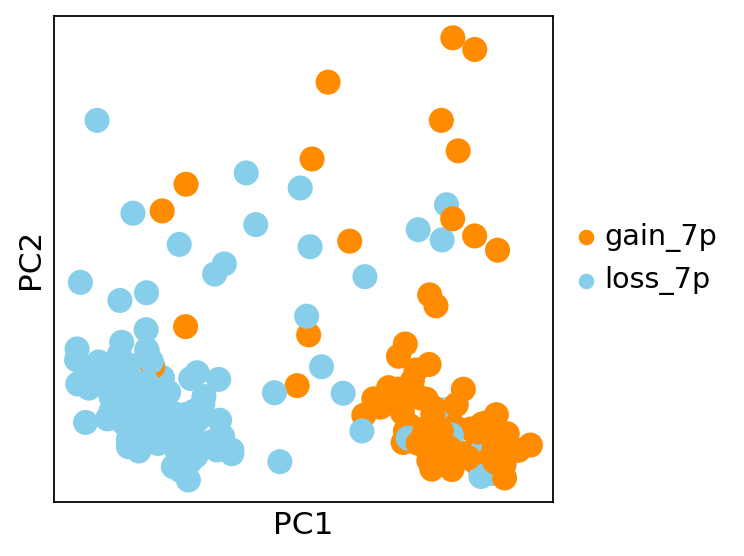

In [1161]:
sc.pl.pca(h, color = ['cna_cluster_7p_cat'] ,
          palette = ['darkorange','skyblue'], 
          title = "")

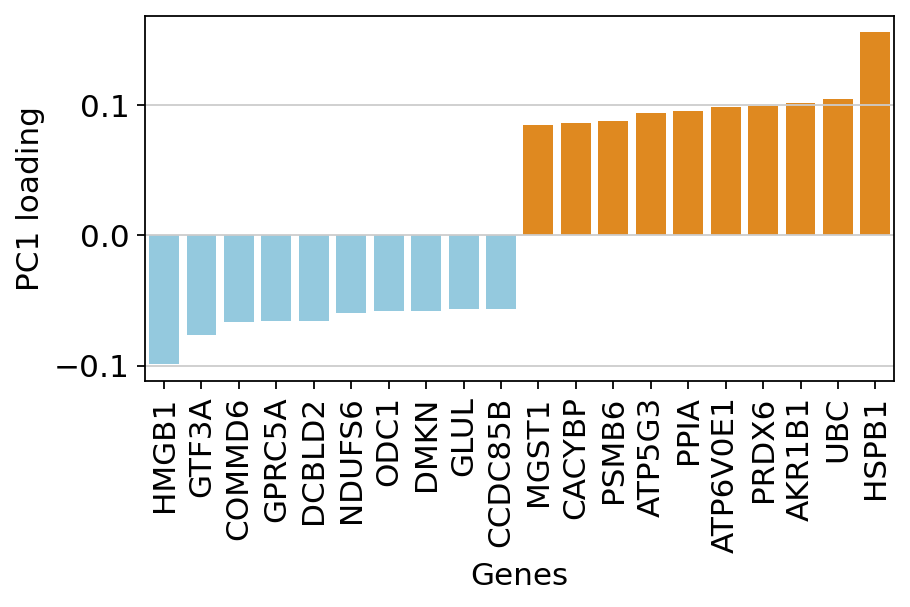

In [1156]:
d = pd.DataFrame(br.varm['PCs'], index = br.var.index).sort_values(by = 0)[:10].append(pd.DataFrame(br.varm['PCs'], index = br.var.index).sort_values(by = 0, ascending = False)[:10]).sort_values(by = 0).reset_index()
d['color'] = 'skyblue'
d.loc[d[0]>0,'color'] = 'darkorange'
plt.subplots(figsize=(6,3))
sns.barplot(data = d, 
            x= "Unnamed: 0", y = 0,
            palette = d['color'])
# sns.barplot(data = d[d[0]>0], x= "Unnamed: 0", y = 0,
#             color = "orange")
plt.xticks(rotation = 90)
plt.xlabel("Genes")
plt.ylabel("PC1 loading")
plt.show()

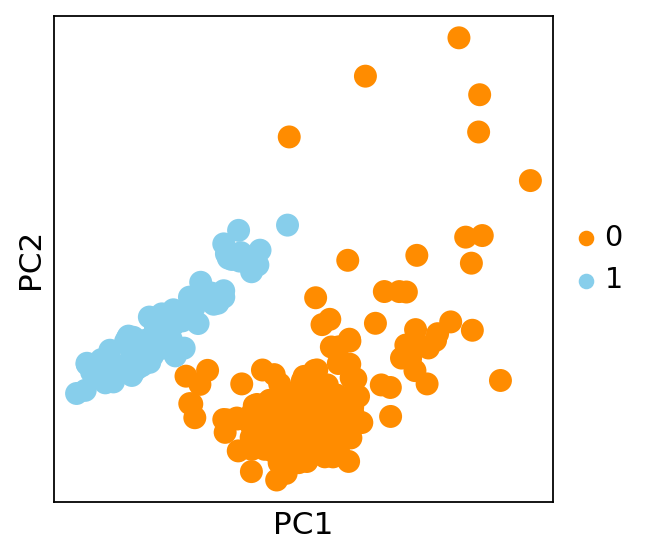

In [1162]:
sc.pl.pca(br, color = ['leiden',] ,
          palette = ['darkorange','skyblue'], 
          title = "")

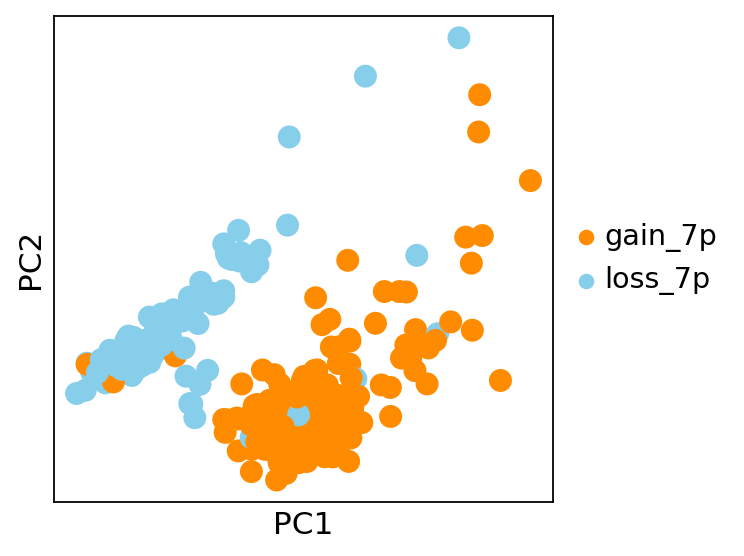

In [1163]:
sc.pl.pca(br, color = ['cna_cluster_7p_cat',] ,
          palette = ['darkorange','skyblue'], 
          title = "")

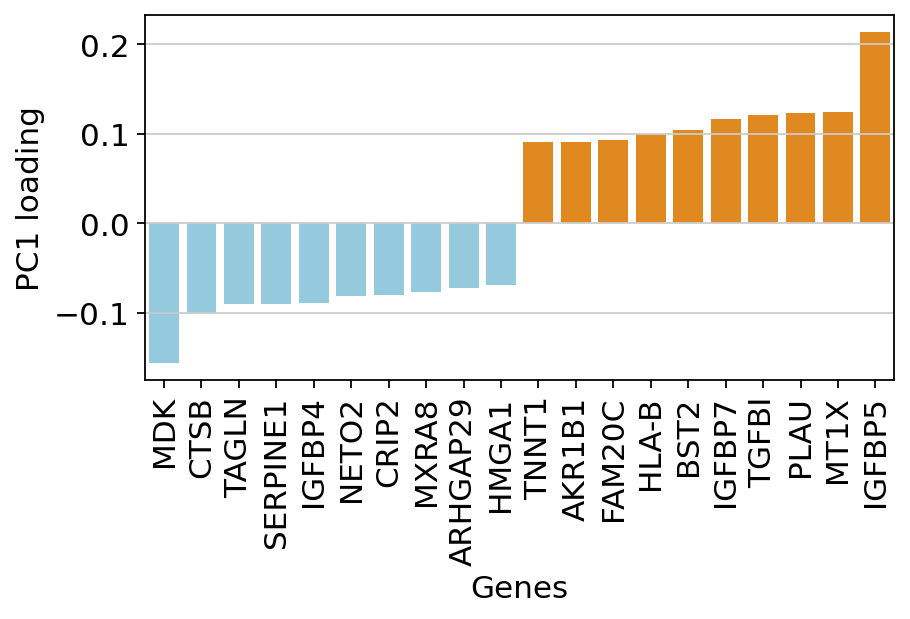

In [1169]:
d = pd.DataFrame(l.varm['PCs'], index = l.var.index).sort_values(by = 0)[:10].append(pd.DataFrame(l.varm['PCs'], index = l.var.index).sort_values(by = 0, ascending = False)[:10]).sort_values(by = 0).reset_index()
d['color'] = 'skyblue'
d.loc[d[0]>0,'color'] = 'darkorange'
plt.subplots(figsize=(6,3))
sns.barplot(data = d, 
            x= "Unnamed: 0", y = 0,
            palette = d['color'])
# sns.barplot(data = d[d[0]>0], x= "Unnamed: 0", y = 0,
#             color = "orange")
plt.xticks(rotation = 90)
plt.xlabel("Genes")
plt.ylabel("PC1 loading")
plt.show()

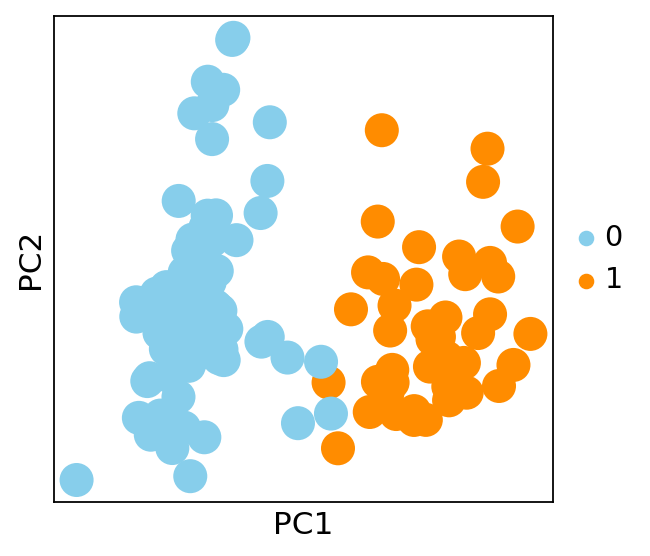

In [1172]:
sc.pl.pca(l, 
          color = ['leiden'], title='',
          palette = ['skyblue' ,'darkorange'])

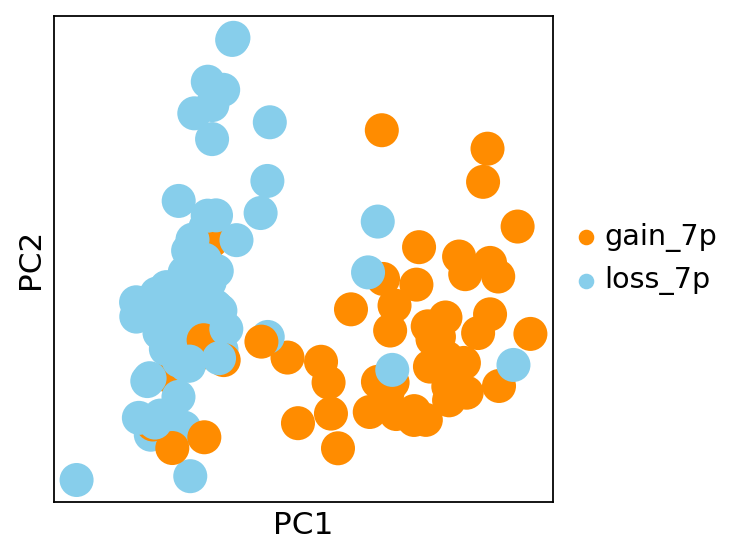

In [1168]:
sc.pl.pca(l, 
          color = ['cna_cluster_7p_cat'],title="", 
          palette = ['darkorange','skyblue'])

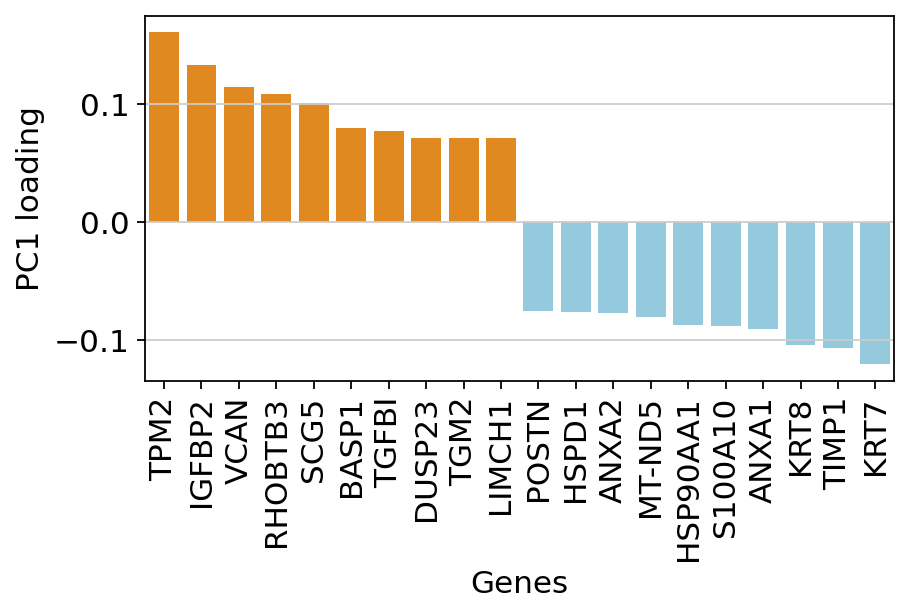

In [1179]:
d = pd.DataFrame(b.varm['PCs'], index = b.var.index).sort_values(by = 0)[:10].append(pd.DataFrame(b.varm['PCs'], index = b.var.index).sort_values(by = 0, ascending = False)[:10]).sort_values(by = 0).reset_index()
d[0] = d[0]*-1
d['color'] = 'skyblue'
d.loc[d[0]>0,'color'] = 'darkorange'
plt.subplots(figsize=(6,3))
sns.barplot(data = d, 
            x= "Unnamed: 0", 
            y = 0,
            palette = d['color'])
# sns.barplot(data = d[d[0]>0], x= "Unnamed: 0", y = 0,
#             color = "orange")
plt.xticks(rotation = 90)
plt.xlabel("Genes")
plt.ylabel("PC1 loading")
plt.show()

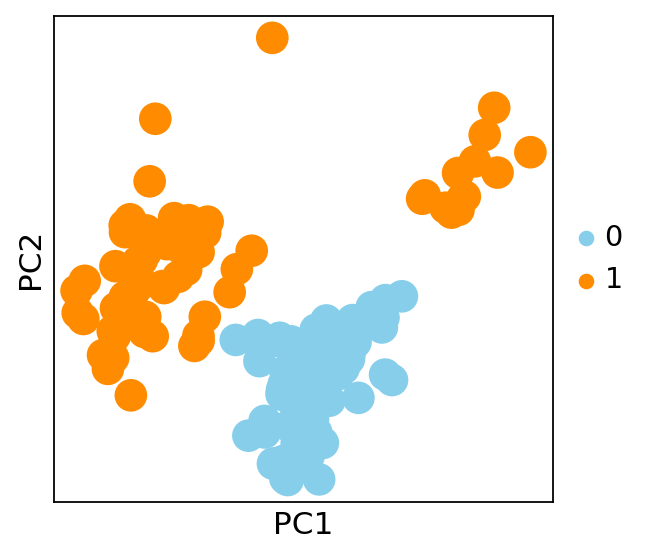

In [1176]:
sc.pl.pca(b,color = ['leiden'], title="",
          palette = ['skyblue', 'darkorange',])

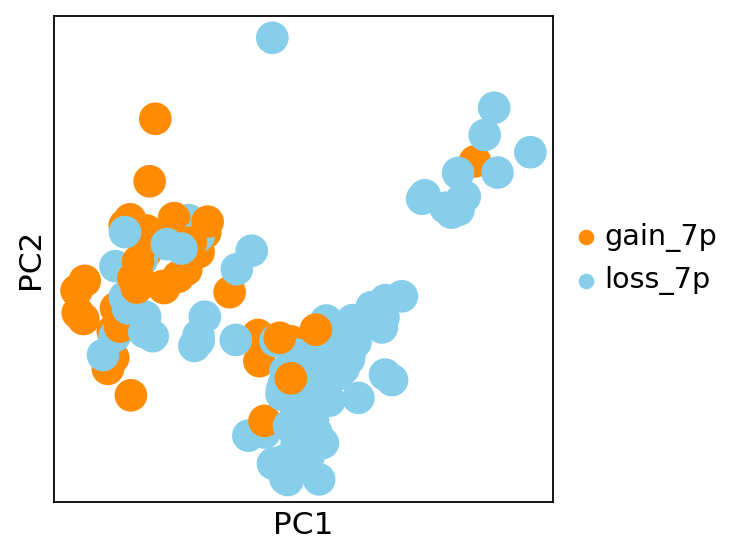

In [1175]:
sc.pl.pca(b,color = ['cna_cluster_7p_cat'], title= "",
          palette = ['darkorange','skyblue'])

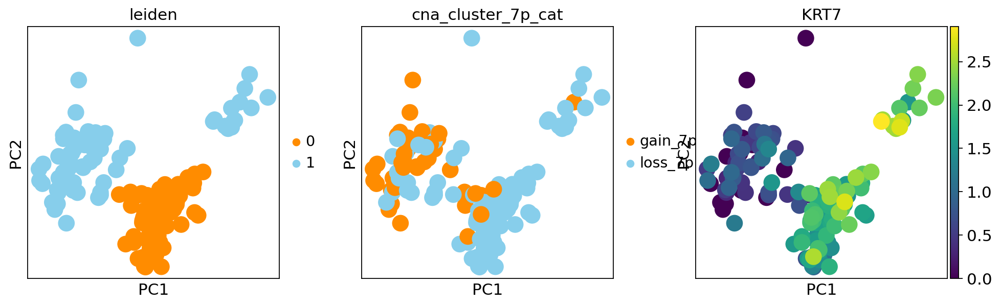

In [1178]:
sc.pl.pca(b,color = ['leiden','cna_cluster_7p_cat', 'KRT7'], 
          palette = ['darkorange','skyblue'])

In [1005]:
k = reproduce('OSRC2_KIDNEY')
s = reproduce('COLO741_SKIN')

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_12q_cat' as categorical
... storing 'cna_cluster_17q_cat' as categorical
... storing 'cna_cluster_19p_cat' as categorical
... storing 'cna_cluster_9q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
ranking genes


... storing 'CCLE_ID' as categorical
... storing 'index.1' as categorical
... storing 'cancer_type' as categorical
... storing 'cancer_type_trunc' as categorical
... storing 'cna_cluster_10p_cat' as categorical
... storing 'cna_cluster_15q_cat' as categorical
... storing 'cna_cluster_19p_cat' as categorical
... storing 'cna_cluster_21q_cat' as categorical
... storing 'cna_cluster_4p_cat' as categorical
... storing 'cna_cluster_4q_cat' as categorical
... storing 'cna_cluster_6p_cat' as categorical
... storing 'cna_cluster_9q_cat' as categorical


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


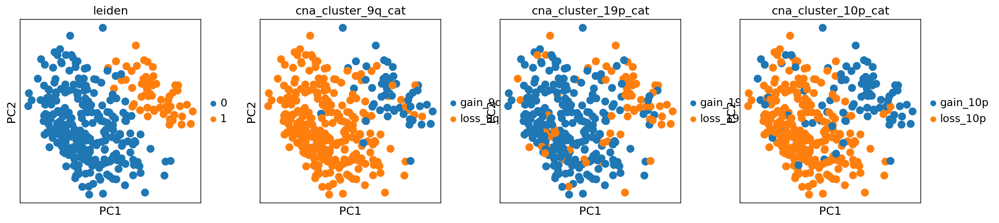

In [1012]:
sc.pl.pca(s,color = ['leiden','cna_cluster_9q_cat', 'cna_cluster_19p_cat','cna_cluster_10p_cat'])

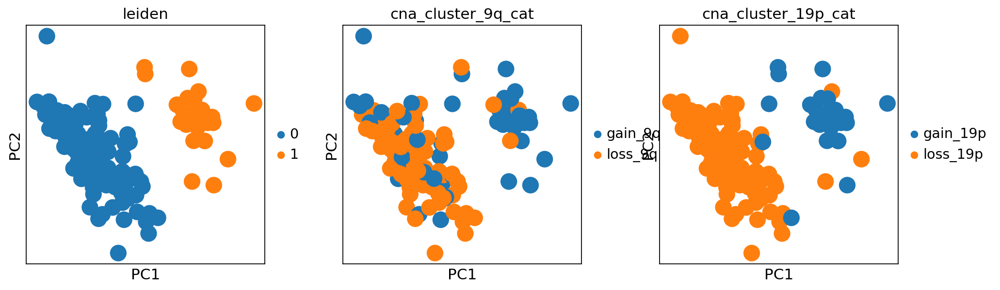

In [1010]:
sc.pl.pca(k,color = ['leiden','cna_cluster_9q_cat', 'cna_cluster_19p_cat'])

In [1018]:
pd.DataFrame(k.uns['rank_genes_groups']['names'])['1'][:15]

0       TPM4
1     RPL18A
2      RPS15
3      RPL36
4      GNG11
5     OCIAD2
6      ATP5D
7      NPDC1
8      CRYAB
9      RPL34
10     RPS28
11    S100A6
12     NUPR1
13       B2M
14    NDUFB7
Name: 1, dtype: object

In [1017]:
pd.DataFrame(s.uns['rank_genes_groups']['names'])['1'][:15]

0        TXN
1       CFL1
2       MT2A
3      RPS24
4      ACTN4
5     LIMCH1
6       RPL8
7       NQO1
8      RPL7A
9      ALDOA
10     RPL35
11     RPS3A
12      RPL9
13    AKR1B1
14     RPL34
Name: 1, dtype: object

In [974]:
fpval_fisher.sort_values(by= 'fdr')

,arm,pval,fdr
7,7q,3.997744e-35,3.997744e-34
4,23q,4.819921e-31,2.409960e-30
6,7p,1.003433e-29,3.344777e-29
0,11q,2.603149e-17,6.507872e-17
1,14q,7.086124e-14,1.417225e-13
2,17p,1.137826e-13,1.896377e-13
9,9q,7.511381e-10,1.073054e-09
8,9p,2.251895e-08,2.814868e-08
5,3q,1.895967e-07,2.106630e-07
3,19p,1.068964e-06,1.068964e-06


In [973]:
fdata.obs.columns

Index(['Barcode', 'n_genes_by_counts', 'total_counts', 'total_counts_mt',
       'pct_counts_mt', 'CCLE_ID', 'index.1', 'cancer_type', 'pool_id',
       'n_cells', 'cancer_type_trunc', 'S1', 'S2', 'S3', 'S4', 'logS1',
       'logS2', 'logS3', 'logS4', 'leiden', 'cna_cluster_11q',
       'cna_cluster_14q', 'cna_cluster_17p', 'cna_cluster_19p',
       'cna_cluster_23q', 'cna_cluster_3q', 'cna_cluster_7p', 'cna_cluster_7q',
       'cna_cluster_9p', 'cna_cluster_9q', 'cna_cluster_11q_cat',
       'cna_cluster_14q_cat', 'cna_cluster_17p_cat', 'cna_cluster_19p_cat',
       'cna_cluster_23q_cat', 'cna_cluster_3q_cat', 'cna_cluster_7p_cat',
       'cna_cluster_7q_cat', 'cna_cluster_9p_cat', 'cna_cluster_9q_cat', '10p',
       '10q', '11p', '11q', '12p', '12q', '13q', '14q', '15q', '16p', '16q',
       '17p', '17q', '18p', '18q', '19p', '19q', '1p', '1q', '20p', '20q',
       '21q', '22q', '23p', '23q', '2p', '2q', '3p', '3q', '4p', '4q', '5p',
       '5q', '6p', '6q', '7p', '7q', '8p', '8q', '

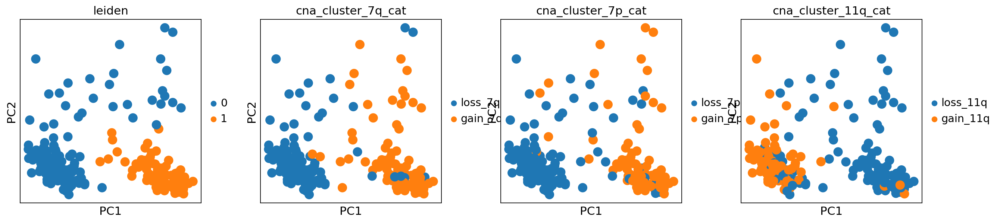

In [975]:
sc.pl.pca(fdata, color = ['leiden','cna_cluster_7q_cat','cna_cluster_7p_cat','cna_cluster_11q_cat'], ncols= 6)

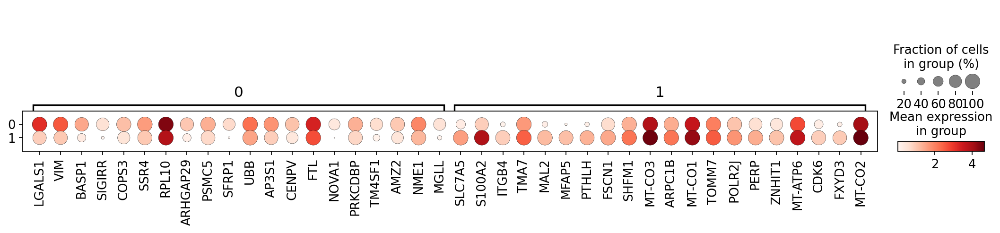

In [976]:
sc.pl.rank_genes_groups_dotplot(fdata, n_genes=20)

In [874]:
pd.DataFrame(data_brca.uns['rank_genes_groups']['names'])

,0,1
0,HSPB1,RPL21
1,RPL13,RPS20
2,MT-CYB,RPS7
3,ARPC2,RPS14
4,PPIA,HMGB1
...,...,...
30309,HMGB1,PPIA
30310,RPS14,ARPC2
30311,RPS7,MT-CYB
30312,RPS20,RPL13


In [875]:
pval_fisher_brca.sort_values(by = "fdr")

,arm,pval,fdr
4,3p,6.680494e-52,4.008296e-51
5,7p,9.544712e-51,2.863414e-50
3,2q,2.300807e-50,4.601614e-50
1,16p,7.274438e-50,1.091166e-49
0,13q,3.817226e-26,4.580671e-26
2,19p,7.215930e-07,7.215930e-07
